In [2]:
import numpy as np
import pandas as pd
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import math
from utils import *
import random
import pickle
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, LinearAxis, Range1d, HoverTool

# Swisstech

Swisstech subcatchment gahthers the runoff to Rejet Convention Center.

## 1. Data input

### 1.1 Precipitation

The 10 min total precipitation data is downloaded from MeteoSwiss IDAWEB, with a unit of mm/10min.\
Lausanne station is chosen (LSN). This station is a part of Automatic Network.

In [2]:
with open('df_precp_st.pkl','rb') as f:
    df_precp_st = pickle.load(f)
df_precp_st.head()

,stn,rre150z0
time,,
2024-07-17 00:00:00,LSN,0.0
2024-07-17 00:05:00,LSN,0.0
2024-07-17 00:10:00,LSN,0.0
2024-07-17 00:15:00,LSN,0.0
2024-07-17 00:20:00,LSN,0.0


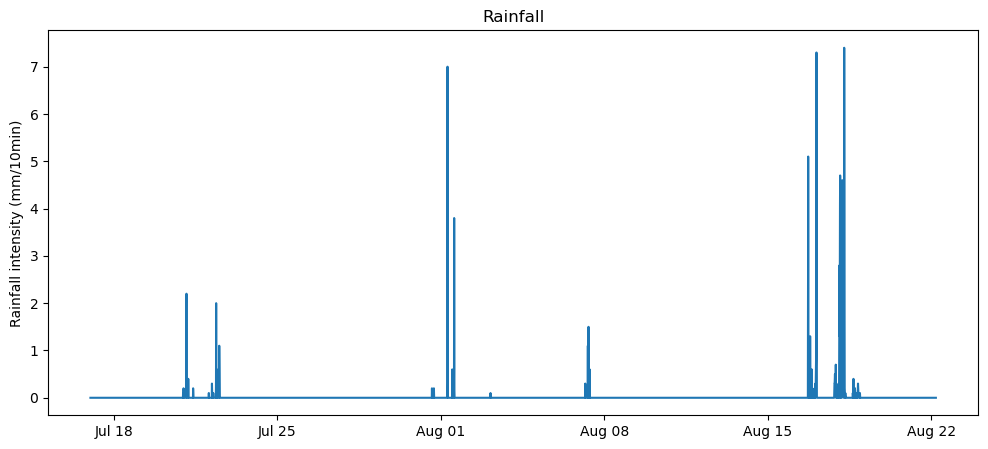

In [3]:
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(df_precp_st.index, df_precp_st['rre150z0'])
ax.set_title("Rainfall")
ax.set_ylabel("Rainfall intensity (mm/10min)")

# ax.xaxis.set_minor_locator(mdates.DayLocator(interval=8))
# ax.xaxis.set_minor_formatter(mdates.DateFormatter('%d'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))

### 1.2 Discharge

What we got is meausred water level data (mm). We use formulat to convert water level to discharge ($m^3/s$). Please resort to utils.py. The resolution is from 15min to 5min. \
Original signal → denoised → denoised shifted → denoised shifted discharge

In [3]:
with open('df_waterlevel_st.pkl', 'rb') as f:
    df_waterlevel = pickle.load(f)
df_waterlevel.head()

,water level (mm),discharge_raw,denoised,discharge_org,discharge_de,denoised_shift,discharge_de_shift
Date,,,,,,,
2024-07-17 00:15:00,18.000000,0.164000,18.280809,0.000366,0.000379,4.369709,0.000016
2024-07-17 00:20:00,18.666667,0.170067,18.745464,0.000396,0.000400,4.834364,0.000021
2024-07-17 00:25:00,19.333333,0.176133,19.138208,0.000428,0.000418,5.227109,0.000025
2024-07-17 00:30:00,20.000000,0.182200,19.637061,0.000460,0.000442,5.725962,0.000030
2024-07-17 00:35:00,19.000000,0.173067,19.066878,0.000412,0.000415,5.155779,0.000024


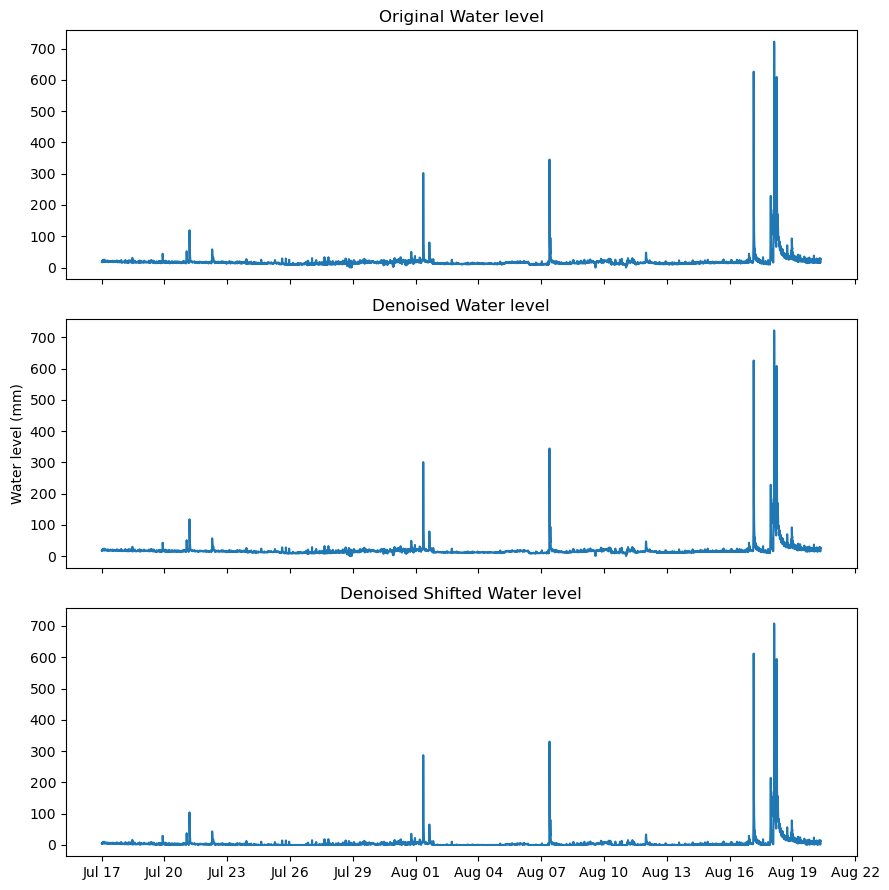

In [5]:
fig, ax = plt.subplots(3,1,figsize=(9,9), sharey=True, sharex=True)
ax[0].plot(df_waterlevel.index, df_waterlevel['water level (mm)'])
ax[0].set_title('Original Water level')
ax[1].plot(df_waterlevel.index, df_waterlevel['denoised'])
ax[1].set_title('Denoised Water level')
ax[1].set_ylabel("Water level (mm)")
ax[2].plot(df_waterlevel.index, df_waterlevel['denoised_shift'])
ax[2].set_title('Denoised Shifted Water level')

# ax[2].xaxis.set_minor_locator(mdates.DayLocator(interval=3))
# ax[2].xaxis.set_minor_formatter(mdates.DateFormatter('%d'))
ax[2].xaxis.set_major_locator(mdates.DayLocator(interval=3))
ax[2].xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))

# plt.ylim((0,100))
plt.tight_layout()
plt.show()

In [4]:
df_waterlevel['discharge_de_shift'] = df_waterlevel['discharge_de_shift'].fillna(0)

Text(0.5, 1.0, 'Measured Discharge (Converted from Water Level)')

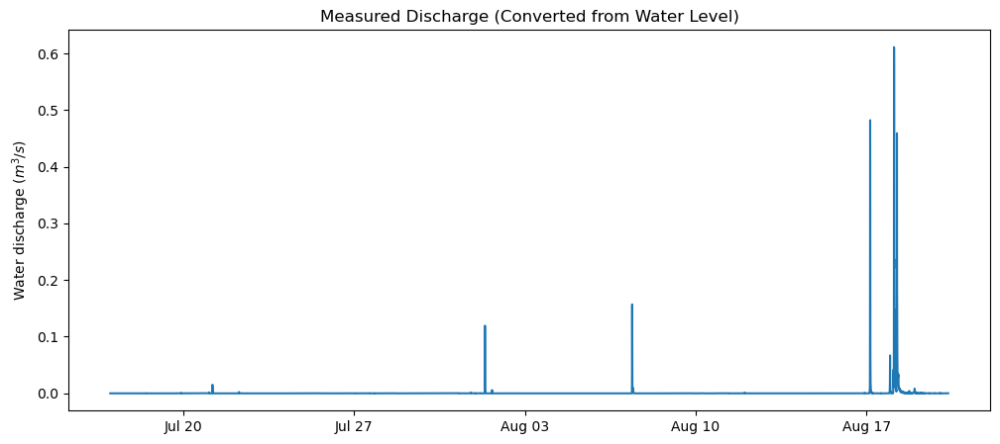

In [7]:
fig, ax = plt.subplots(figsize=(12,5))
ax.plot(df_waterlevel.index, df_waterlevel['discharge_de_shift'])
# ax.plot(df_waterlevel['TIME'], df_waterlevel['Simulation'], label='Simulation')
# ax.legend()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax.set_ylabel('Water discharge ($m^3/s$)')
ax.set_title('Measured Discharge (Converted from Water Level)')

In [8]:
# Output the plot inline in the notebook
output_notebook()
df1 = df_waterlevel.copy()
df1.reset_index()
# Convert DataFrame to ColumnDataSource for Bokeh
source1 = ColumnDataSource(df1)
# source2 = ColumnDataSource(df_test)

# Create a figure with a datetime x-axis
p = figure(x_axis_type="datetime", title="Measured", x_axis_label='Date', y_axis_label='Water discharge (L^3/s)', width=1000)
p.y_range = Range1d(0, np.max(df1['discharge_de_shift']+0.05))
# Plot the first column as a line
p.line('Date', 'discharge_de_shift', source=source1, legend_label="Discharge", line_width=3, color="blue")
p.extra_y_ranges = {"h": Range1d(start=0, end=np.max(df1['denoised_shift']+0.5))}
p.add_layout(LinearAxis(y_range_name="h", axis_label='Water level (mm)'), 'right')
p.line('Date', 'denoised_shift', source=source1, legend_label="Water level", line_width=1, color="green", y_range_name="h")

p.legend.location="top_left"
# Show the plot
show(p)

Loading BokehJS ...

### 1.3 Hydrique

There are two kinds of Hydrique data: Stormwater (L/s) and Simulation (L/s). This model is quite mysterious.

In [2]:
with open('df_hydrique_st.pkl', 'rb') as f:
    df_hydrique = pickle.load(f)
df_hydrique.head()

,TIME,Stormwater,Simulation
0,2024-07-16 23:20:00,NaN,NaN
1,2024-07-16 23:25:00,NaN,NaN
2,2024-07-16 23:30:00,NaN,NaN
3,2024-07-16 23:35:00,NaN,NaN
4,2024-07-16 23:40:00,NaN,NaN


In [3]:
df_hydrique['Stormwater'] = df_hydrique['Stormwater']/1000
df_hydrique['Simulation'] = df_hydrique['Simulation']/1000

Text(0, 0.5, 'Water discharge ($m^3/s$)')

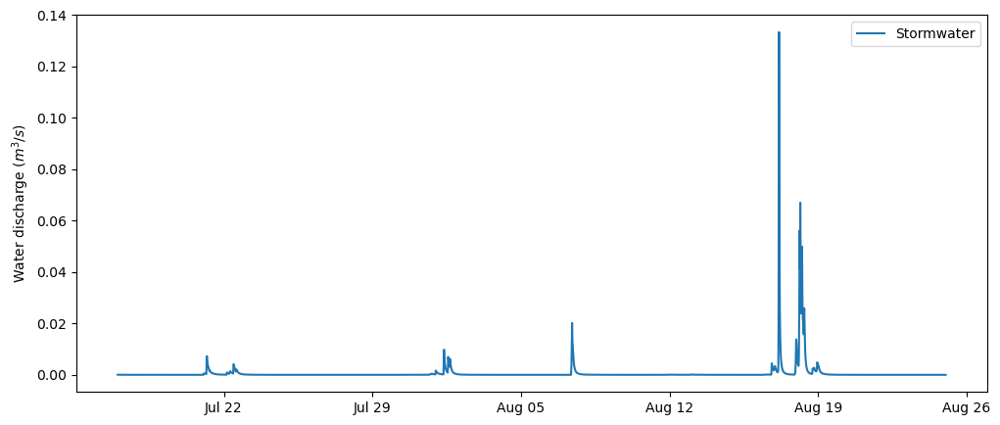

In [5]:
fig, ax = plt.subplots(figsize=(12,5))
ax.plot(df_hydrique['TIME'], df_hydrique['Stormwater'], label='Stormwater')
# ax.plot(df_hydrique['TIME'], df_hydrique['Simulation'], label='Simulation')
ax.legend()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax.set_ylabel('Water discharge ($m^3/s$)')
# ax.set_title('Hydrique Model Performance')



In [12]:
# Output the plot inline in the notebook
output_notebook()

# Convert DataFrame to ColumnDataSource for Bokeh
source1 = ColumnDataSource(df_hydrique)
# source2 = ColumnDataSource(df_test)

# Create a figure with a datetime x-axis
p = figure(x_axis_type="datetime", title="Hydrique Model", x_axis_label='Date', y_axis_label='Water discharge (L^3/s)')

# Plot the first column as a line
p.line('TIME', 'Stormwater', source=source1, legend_label="Stormwater (Runoff)", line_width=2, color="blue")

# Plot the second column as a line
p.line('TIME', 'Simulation', source=source1, legend_label="Simulation (Discharge)", line_width=2, color="green")
# p.line('TIME', 'Simulation 10min', source=source2, legend_label="Simulation rejet", line_width=1, color="red")
p.legend.location="top_left"
# Show the plot
show(p)


Loading BokehJS ...

### 1.4 Wind

During calibration, we found that both measured discharge and Hydrique model has a delay (for Swisstech subcatchment about 2h) compared with the precipitation. One assumption is that EPFL rainfall has a delay compared with Lausanne rainfall and some rainfall amount was lost in the vapor transportation through wind. Therefore, we employ wind data (spped and direction) to do vector decompostion of precipitation, trying to explain the lag.

The wind data is from Lausanne station (NABLAU). Both features are in 10 min resolution (speed: km/h, direction: degree)


In [7]:
with open("df_wind_st.pkl", "rb") as f:
    df_wind = pickle.load(f)

df_wind

,time,windspeed_m/s,windspeed_km/h,winddirection
0,2024-07-17 00:00:00,0.40,1.4,219.0
1,2024-07-17 00:05:00,0.40,1.4,220.0
2,2024-07-17 00:10:00,0.40,1.4,221.0
3,2024-07-17 00:15:00,0.40,1.4,254.5
4,2024-07-17 00:20:00,0.40,1.4,288.0
...,...,...,...,...
11282,2024-08-25 04:10:00,0.70,2.5,199.0
11283,2024-08-25 04:15:00,0.75,2.7,251.5
11284,2024-08-25 04:20:00,0.80,2.9,304.0
11285,2024-08-25 04:25:00,0.75,2.7,310.0


## 2. Data Integration

Merge into one dataframe to facilitate plotting.

In [2]:
with open("df_swstch.pkl", "rb") as f:
    df_swstch = pickle.load(f)

In [3]:
df_swstch.head()

,time,precp,water level (mm),discharge_raw,denoised,discharge_org,discharge_de,denoised_shift,discharge_de_shift,Stormwater,Simulation,windspeed_m/s,windspeed_km/h,winddirection
0,2024-07-17 00:15:00,0.0,18.000000,0.164000,18.280809,0.000366,0.000379,4.369709,0.000016,0.042271,12.3290,0.4,1.4,254.5
1,2024-07-17 00:20:00,0.0,18.666667,0.170067,18.745464,0.000396,0.000400,4.834364,0.000021,0.041881,12.1348,0.4,1.4,288.0
2,2024-07-17 00:25:00,0.0,19.333333,0.176133,19.138208,0.000428,0.000418,5.227109,0.000025,0.041500,11.9531,0.5,1.8,295.0
3,2024-07-17 00:30:00,0.0,20.000000,0.182200,19.637061,0.000460,0.000442,5.725962,0.000030,0.041120,11.7714,0.6,2.2,302.0
4,2024-07-17 00:35:00,0.0,19.000000,0.173067,19.066878,0.000412,0.000415,5.155779,0.000024,0.040749,11.6460,0.6,2.2,302.0


In [4]:
df_swstch['Stormwater'] = df_swstch['Stormwater']/1000
df_swstch['Simulation'] = df_swstch['Simulation']/1000

In [5]:
df_swstch['discharge_de_shift'] = df_swstch['discharge_de_shift'].fillna(0)

## 3. Initial Parameters

### 3.1 Fixed parameter

We don't do sensitivity analysis on fixed parameters.

In [3]:
# [mare foret paturage prairie gazon-fleuri pelouse grille-gazon gravier mineral-compacte]
omegas_st = np.array([0, 0, 0, 2236.43, 1701.78, 0, 0, 0, 0])
# [platform, surface-impermeable]
omega0_st = np.array([5141.19, 6962.80])
# [tank-like roof, roof]
omegat_st = np.array([6225.88, 6035.83]) 

area_tt = sum(omega0_st) + sum(omegas_st) + sum(omegat_st)

TODO: 加一个饼图

### TODO: 3.2 Soil characteristics

TODO: Change the parameter according to the report: soil texture, rooting depth, infiltration rate.

Assumption: The soil in the same subcatchment is uniform.

Therefore: The following parameters can be modified.

Further: Change Emax according to temperature.

In [4]:
soil = dict()
texture=["sand", "loamy sand", "sandy loam", "loam", "clay"]
for t in texture:
    soil[t] = dict()

In [5]:
soil['sand'] = {"Ks":500, "n":0.35, "beta":12.1, "sh":0.08, "sw":0.11, "ss":0.33, "sfc":0.35}
soil['loamy sand'] = {"Ks":100, "n":0.42, "beta":12.7, "sh":0.08, "sw":0.11, "ss":0.31, "sfc":0.52}
soil['sandy loam'] = {"Ks":80, "n":0.43, "beta":13.8, "sh":0.14, "sw":0.18, "ss":0.46, "sfc":0.56}
soil['loam'] = {"Ks":20, "n":0.45, "beta":14.8, "sh":0.19, "sw":0.24, "ss":0.57, "sfc":0.65}
soil['clay'] = {"Ks":1, "n":0.5, "beta":26.8, "sh":0.47, "sw":0.52, "ss":0.78, "sfc":0.99}

In [6]:
n = 0.45          # porosity 
Z_root = 70
Z_soil = n * Z_root   # grass root depth[cm]
E_max = 0.5             #maximum evapotranspiration for grass[cm/day]
E_w = E_max / 8        # evapotraspiration at soil wilting point [cm/day]
beta = 14.8            # soil characteristics
s_h = 0.19 
s_w = 0.24
s_s = 0.57
s_fc = 1
Ks = 20              # saturated hydraulic conductivity [cm/day]

eta_w = E_w / Z_soil;        # normalized maximum evapotranspiration [-/day]
eta = E_max / Z_soil
m = Ks / (Z_soil * (np.exp(beta * (1 - s_fc)) - 1))

C:\Users\whh\AppData\Local\Temp\ipykernel_18428\4291803380.py:15: RuntimeWarning: divide by zero encountered in double_scalars
  m = Ks / (Z_soil * (np.exp(beta * (1 - s_fc)) - 1))


### 3.3 Other Parameters

For the 3rd reservoir, more parameters are added in. We'll discuss later.

In [10]:
k = 100 #[/day] Time constant
rf2s = 0.5 # meaning half of the rain falling on the roof will go to the soil.

## 4. Model Calibration

### 4.1 Baseline model

Half of the rainfall on the roof will go to the soil.

No interception. Emax doesn't rely on temperature.

In [11]:
def model_st(df, k=100, frac_rt2s=0.5, frac_rt2tk=0, Z_root=70, E_max=0.5, E_w=0.0625, heavy=55/600000, soiltype="loamy sand",\
        omegas=sum(omegas_st), omega0=sum(omega0_st), omegat=sum(omegat_st), Vtmax=0, lag=0, resolution=5):
    
    rain = df['precp'].fillna(0)
    rain_lag = rain if lag==0 else np.concatenate((np.zeros(lag), rain[:-lag]))

    # Soil parameters
    Ks = soil[soiltype]['Ks']
    n = soil[soiltype]['n']
    beta = soil[soiltype]['beta']
    s_h = soil[soiltype]['sh']
    s_w = soil[soiltype]['sw']
    s_s = soil[soiltype]['ss']
    s_fc = soil[soiltype]['sfc']
    # Initialization
    y0 = [0, s_s, 0]
    y_result = np.zeros((df.shape[0], 3))
    y_result[0] = y0
    dydt = np.zeros(3)
    Qs = np.zeros(df.shape[0])
    Qout = np.zeros(df.shape[0])
    Qt = np.zeros(df.shape[0])
    
    

    for i in range(df.shape[0]-1):
        p = rain_lag[i]/(1000*10*60) #convert from mm/10min to m/s

        ####### Qs #########
        if y_result[i,1] >= s_fc:
            Qs[i] = p * (omegas + frac_rt2s*omegat)
        elif p>heavy:
            Qs[i] = (p-heavy)*(omegas + frac_rt2s*omegat)
        else:
            Qs[i] = 0

        #============ Qout ===============#
        V_runoff = y_result[i,0]*omega0 # Water volume of V0 reservoir at time point i
        Qout[i] = k * V_runoff / 86400 # Turn k [/day] to k [/s]

        #============ Qt =================#
        Vt = frac_rt2tk*omegat*y_result[i, 2]
        Qt[i] = p*frac_rt2tk*omegat if (Vt>Vtmax) else 0

        #==============Road reservoir==========#
        dydt[0] = (p*(omega0+(1-frac_rt2tk)*(1-frac_rt2s)*omegat) + Qs[i] + Qt[i] - Qout[i])/omega0
        
        y_result[i+1, 0] = y_result[i, 0] + dydt[0]*60*resolution # tspan resolution is 10 min = 600s
        if y_result[i+1, 0] < 0:
            y_result[i+1, 0] = 0
        #==============Soil reservoir==========#
        Z_soil = n*Z_root
        dydt[1] = p*(1+(1-frac_rt2tk)*frac_rt2s*omegat/omegas)/ (Z_soil / 100) \
                 - rho(y_result[i, 1],n, Z_root, E_max, E_w, beta, s_h, s_w, s_s, s_fc, Ks) / 86400

        y_result[i+1, 1] = y_result[i, 1] + dydt[1]*60*resolution
        if y_result[i+1, 1] >=1:
            y_result[i+1, 1] = 1

        #==============Tank reservoir==========#
        if frac_rt2tk != 0:
            dydt[2] = p - (Qt+Qp)/(frac_rt2tk*omegat)
            y_result[i+1, 2] = y_result[i, 2] + dydt[2]*60*resolution
            hmax = Vtmax/(frac_rt2tk*omegat)
            if y_result[i+1, 2] >= hmax:
                y_result[i+1, 2] = hmax
        else:
            dydt[2] = 0
            y_result[:, 2] = 0
    
        
    df_return = df.copy()
    # column = "Qout_k"+str(k)
    # df_return[column] = Qout
    df_return['Qout'] = Qout
    df_return['Qs'] = Qs
    df_return['Qt'] = Qt
    df_return['soil_mois'] = y_result[:,1]
    df_return['h_tank'] = y_result[:,2]

    return df_return

In [12]:
lagging = 0
k_st = 60
rt2s = 0.5

df_st_base = model_st(df_swstch, k=k_st, lag=lagging, frac_rt2s=rt2s)

In [17]:
# Output the plot inline in the notebook
output_notebook()
# Convert DataFrame to ColumnDataSource for Bokeh
source1 = ColumnDataSource(df_st_base)
# source2 = ColumnDataSource(df_test)

# Create a figure with a datetime x-axis
p = figure(x_axis_type="datetime", title="Measured", x_axis_label='Date', y_axis_label='Water discharge (L^3/s)', width=1000)
p.y_range = Range1d(0, np.max(df_st_base['precp']+0.05))
p.line('time', 'precp', source=source1, legend_label='Rainfall', color="cyan")
# Plot the first column as a line
p.extra_y_ranges = {"discharge": Range1d(start=0, end=np.max(df_st_base['discharge_de_shift']+0.05))}
p.add_layout(LinearAxis(y_range_name="h", axis_label='Water level (mm)'), 'right')
p.line('time', 'discharge_de_shift', source=source1, legend_label="Discharge", line_width=3, color="blue", y_range_name="discharge")
p.line('time', 'Qout', source=source1, legend_label="Modeled", line_width=3, color="green")
p.line('time', 'Stormwater', source=source1, legend_label="Hydrique", line_width=3, color="red")

# p.line('Date', 'denoised_shift', source=source1, legend_label="Water level", line_width=1, color="green", y_range_name="h")

p.legend.location="top_left"
# Show the plot
show(p)

Loading BokehJS ...

ERROR:bokeh.core.validation.check:E-1020 (BAD_EXTRA_RANGE_NAME): An extra range name is configured with a name that does not correspond to any range: y_range_name='h' [LinearAxis(id='p1062', ...)]


Text(0.5, 1.0, 'Modeled Discharge of Swisstech01 Subcatchment')

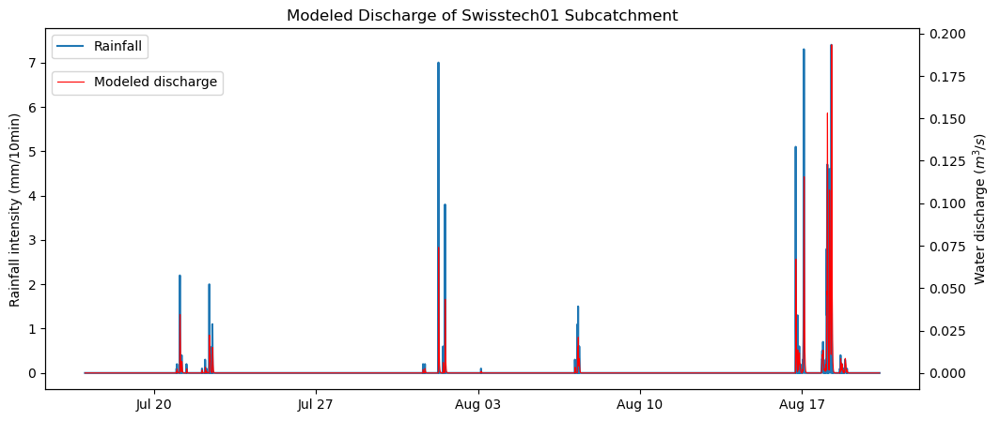

In [146]:
lagging = 0
k_st = 60
rt2s = 0.5

df_st_base = model_st(df_swstch, k=k_st, lag=lagging, frac_rt2s=rt2s)

fig, ax = plt.subplots(figsize=(12,5))
ax.plot(df_st_base['time'], df_st_base['precp'], label="Rainfall")
# ax.bar(df_st_base['time'], df_st_base['precp'], width=0.05, alpha = 0.6, label='Rainfall')
ax.legend()
ax.set_ylabel("Rainfall intensity (mm/10min)")

# ax.xaxis.set_minor_locator(mdates.DayLocator(interval=8))
# ax.xaxis.set_minor_formatter(mdates.DateFormatter('%d'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax2 = ax.twinx()
ax2.plot(df_st_base['time'], df_st_base['Qout'], label="Modeled discharge", color='red', linewidth=0.8)
ax2.legend(bbox_to_anchor=(0.21, 0.9))
ax2.set_ylabel("Water discharge ($m^3/s$)")
ax.set_title("Modeled Discharge of Swisstech01 Subcatchment")

In [56]:
start1 = "2024-07-20 22:00:00"
end1 = "2024-07-21 14:00:00" #actually 10:00

### 4.2 Sensitivity analysis

#### 4.2.1 K

In [66]:
df_testk = df_swstch.copy()
range_k = np.linspace(20, 120, 6, dtype=int)
for k_test in range_k:
    columnname = "Qout_k"+str(k_test)
    df = model_st(df_swstch, k=k_test)
    df_testk[columnname] = df['Qout']

Text(0, 0.5, 'Modeled Discharge ($m^3/s$)')

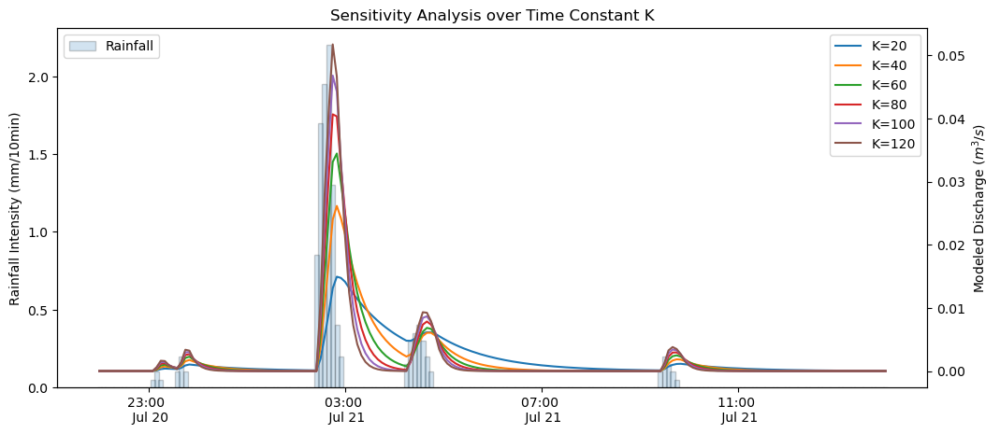

In [67]:
df_testk1 = slicing(df_testk, start1, end1, "time", date_index=False)
fig, ax = plt.subplots(figsize=(12,5))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=4))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:00 \n %b %d"))
ax.bar(df_testk1['time'], df_testk1['precp'], edgecolor='black', width=0.004, alpha = 0.2, label='Rainfall')
ax.set_title("Sensitivity Analysis over Time Constant K")
ax.set_ylabel("Rainfall Intensity (mm/10min)")
ax.legend(loc="upper left")
ax2 = ax.twinx()
for k in range_k:
    columnname = "Qout_k"+str(k)
    ax2.plot(df_testk1['time'], df_testk1[columnname], label="K="+str(k))

ax2.legend(loc="upper right")
ax2.set_ylabel("Modeled Discharge ($m^3/s$)")



Text(0, 0.5, 'Accumulated discharge ($m^3/s$)')

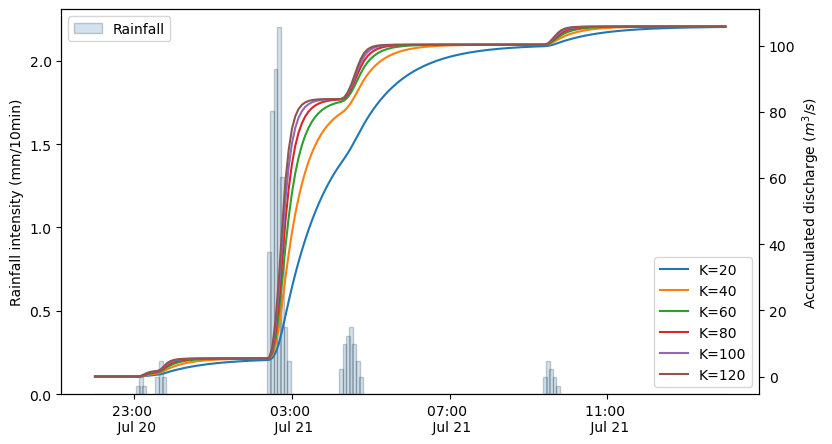

In [96]:
fig, ax = plt.subplots(figsize=(9,5))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=4))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:00 \n %b %d"))
ax.bar(df_testk1['time'], df_testk1['precp'], edgecolor='black', width=0.004, alpha = 0.2, label='Rainfall')
# ax.set_title("Sensitivity Analysis over Time Constant K")
ax.set_ylabel("Rainfall intensity (mm/10min)")
ax.legend(loc="upper left")
ax2 = ax.twinx()
for k in range_k:
    columnname = "Qout_k"+str(k)
    ax2.plot(df_testk1['time'], df_testk1[columnname].cumsum()*300, label="K="+str(k))

ax2.legend(loc="lower right")
ax2.set_ylabel("Accumulated discharge ($m^3/s$)")


Text(-0.02, 0.5, 'Accumulated discharge ($m^3/s$)')

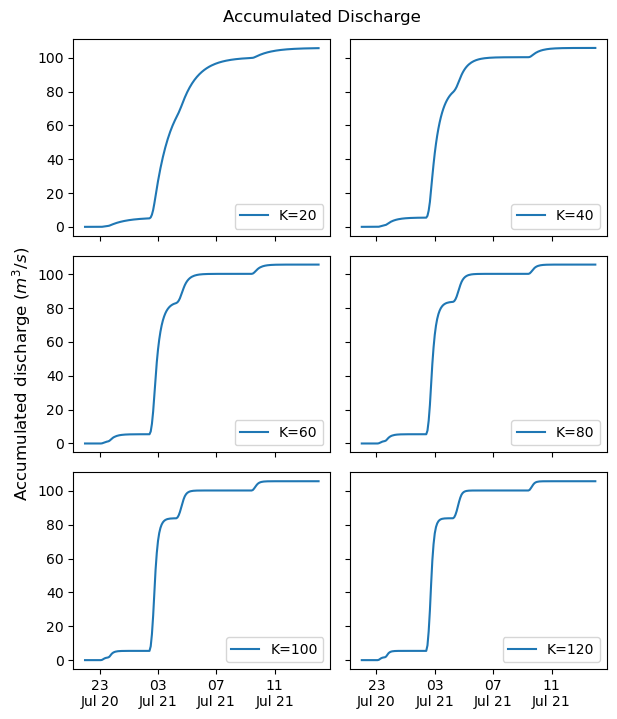

In [ ]:
fig, axs = plt.subplots(3,2, sharex=True, sharey=True, figsize=(6,7))

for i, ax in enumerate(axs.flat):
    k = range_k[i]
    col = "Qout_k"+str(k)
    ax.plot(df_testk1['time'], df_testk1[col].cumsum()*300, label="K="+str(k))
    ax.legend(loc='lower right')
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=4))
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%H\n%b %d"))

plt.tight_layout()
fig.suptitle("Accumulated Discharge", x=0.5, y=1.02)
fig.supylabel("Accumulated discharge ($m^3/s$)", x=-0.02, y=0.5)


#### Soil

In [164]:
df_tests = df_swstch.copy()

for t in soil:
    columnname = "Qout_"+t
    df = model_st(df_swstch, k=60, soiltype=t)
    df_tests[columnname] = df['Qout']

    colname_qs = "Qs_"+t
    df_tests[colname_qs] = df['Qs']

    colname_sm = "moisture_"+t
    df_tests[colname_sm] = df['soil_mois']
    

KeyboardInterrupt: 

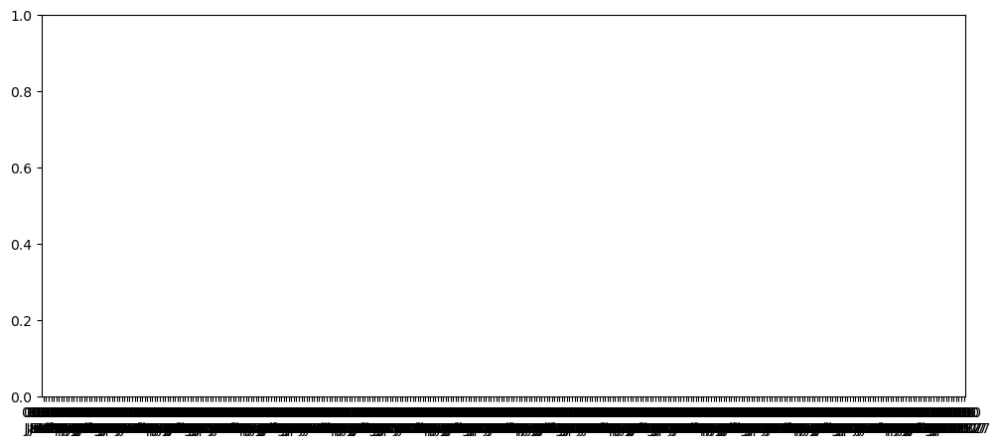

In [151]:
df_tests1 = slicing(df_tests, start1, end1, "time", date_index=False)
fig, ax = plt.subplots(figsize=(12,5))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:00 \n %b %d"))
ax.bar(df_tests['time'], df_tests['precp'], edgecolor='black', width=0.004, alpha = 0.2, label='Rainfall')
ax.set_title("Sensitivity Analysis over Time Constant K")
ax.set_ylabel("Rainfall Intensity (mm/10min)")
ax.legend(loc="upper left")
ax2 = ax.twinx()
for t in soil:
    columnname = "Qs_"+t
    ax2.plot(df_tests['time'], df_tests[columnname], label=t)

ax2.legend(loc="upper right")
ax2.set_ylabel("Modeled Discharge ($m^3/s$)")

Text(0, 0.5, 'Soil overflow ($m^3/s$)')

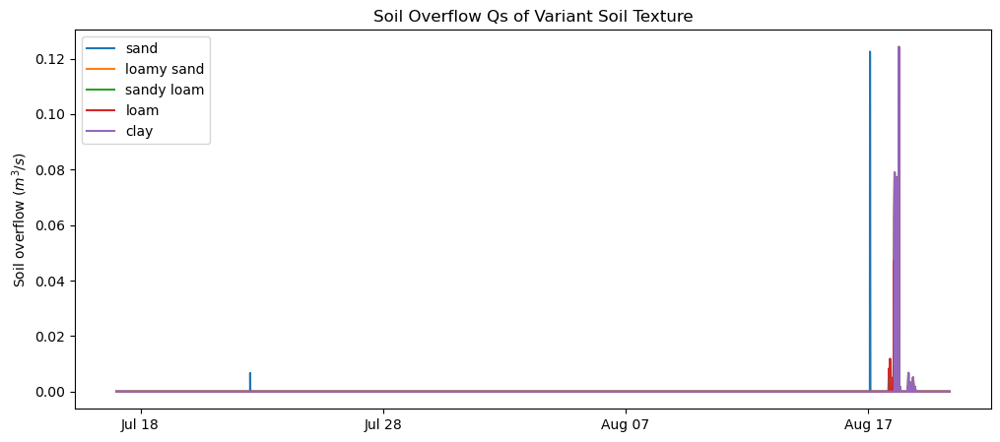

In [179]:
fig, ax = plt.subplots(figsize=(12,5))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %d"))
# ax.bar(df_tests['time'], df_tests['precp'], edgecolor='black', width=0.004, alpha = 0.2, label='Rainfall')
ax.set_title("Soil Overflow Qs of Variant Soil Texture")
# ax.set_ylabel("Rainfall Intensity (mm/10min)")


for t in soil:
    columnname = "Qs_"+t
    ax.plot(df_tests['time'], df_tests[columnname], label=t)
ax.legend(loc="upper left")

ax.set_ylabel("Soil overflow ($m^3/s$)")

Text(0, 0.5, 'Soil moisture')

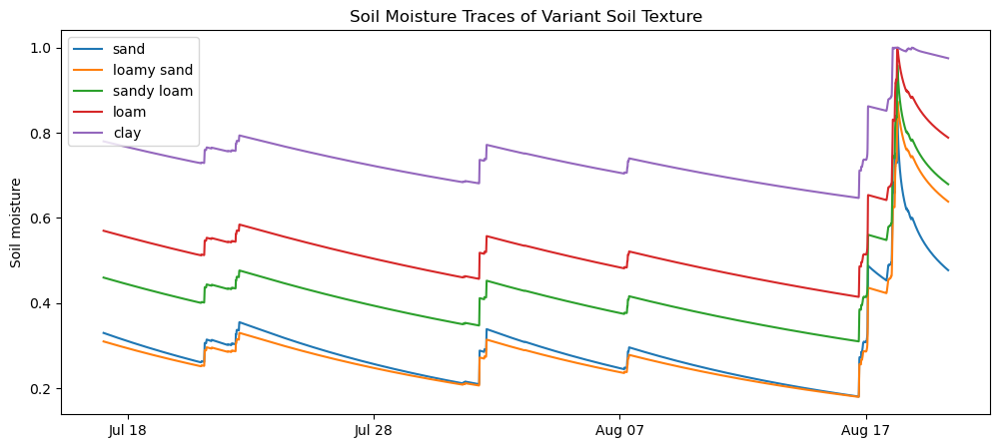

In [176]:
fig, ax = plt.subplots(figsize=(12,5))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %d"))
# ax.bar(df_tests['time'], df_tests['precp'], edgecolor='black', width=0.004, alpha = 0.2, label='Rainfall')
ax.set_title("Soil Moisture Traces of Variant Soil Texture")
# ax.set_ylabel("Rainfall Intensity (mm/10min)")


for t in soil:
    columnname = "moisture_"+t
    ax.plot(df_tests['time'], df_tests[columnname], label=t)
    # ax.hlines(y=soil[t]['sfc'], xmin=df_tests['time'][0],xmax=df_tests['time'][9000])
ax.legend(loc="upper left")

ax.set_ylabel("Soil moisture")

Text(-0.02, 0.5, 'Accumulated discharge ($m^3/s$)')

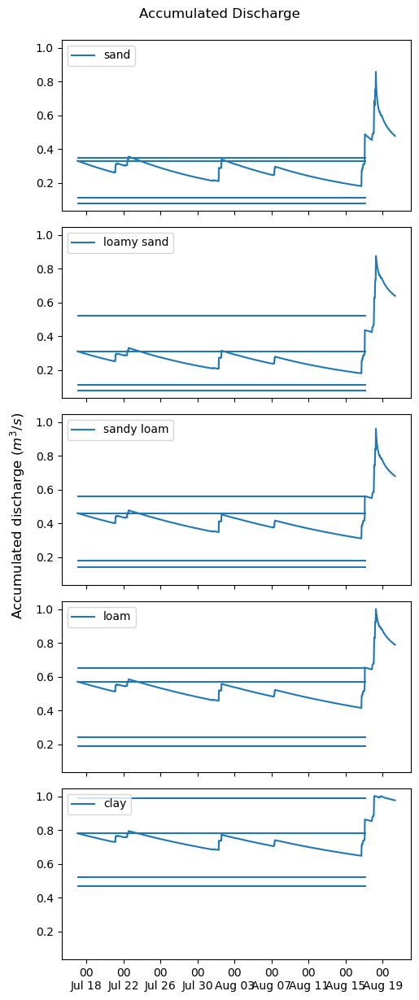

In [175]:
fig, axs = plt.subplots(5,1, sharex=True, sharey=True, figsize=(5,12))

for i, ax in enumerate(axs.flat):
    t = texture[i]
    col = "moisture_"+t
    ax.plot(df_tests['time'], df_tests[col], label=t)
    ax.hlines(y=[soil[t]['sh'], soil[t]['sw'], soil[t]['ss'],soil[t]['sfc']], xmin=df_tests['time'][0], xmax=df_tests['time'][9000])
    ax.legend(loc='upper left')
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=4))
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%H\n%b %d"))

plt.tight_layout()
fig.suptitle("Accumulated Discharge", x=0.5, y=1.02)
fig.supylabel("Accumulated discharge ($m^3/s$)", x=-0.02, y=0.5)

Text(0, 0.5, 'Accumulated discharge ($m^3/s$)')

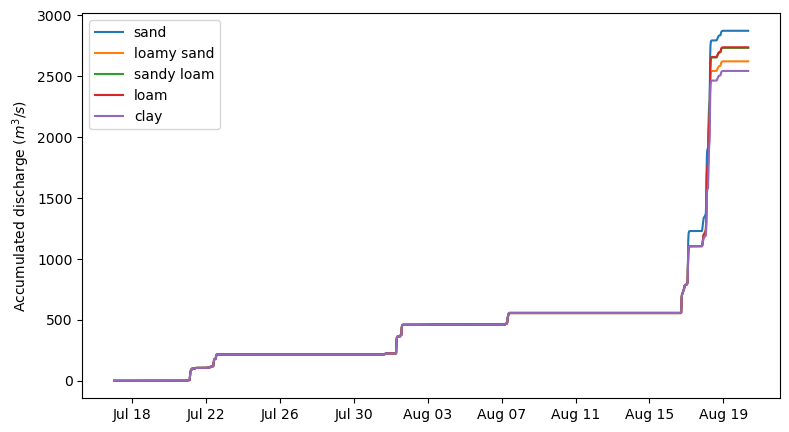

In [231]:
fig, ax = plt.subplots(figsize=(9,5))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=4))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %d"))
# ax.bar(df_testk1['time'], df_testk1['precp'], edgecolor='black', width=0.004, alpha = 0.2, label='Rainfall')
# ax.set_title("Sensitivity Analysis over Time Constant K")
# ax.set_ylabel("Rainfall intensity (mm/10min)")
# ax.legend(loc="upper left")
# ax2 = ax.twinx()
for t in texture:
    columnname = "Qout_"+t
    ax.plot(df_tests['time'], df_tests[columnname].cumsum()*300, label=t)

ax.legend(loc="upper left")
ax.set_ylabel("Accumulated discharge ($m^3/s$)")

In [198]:
start5 = "2024-08-17 18:00:00"
end5 = "2024-08-19 02:00:00"
df_tests5 = slicing(df_tests, start5, end5, "time", date_index=False)

Text(0, 0.5, 'Soil overflow ($m^3/s$)')

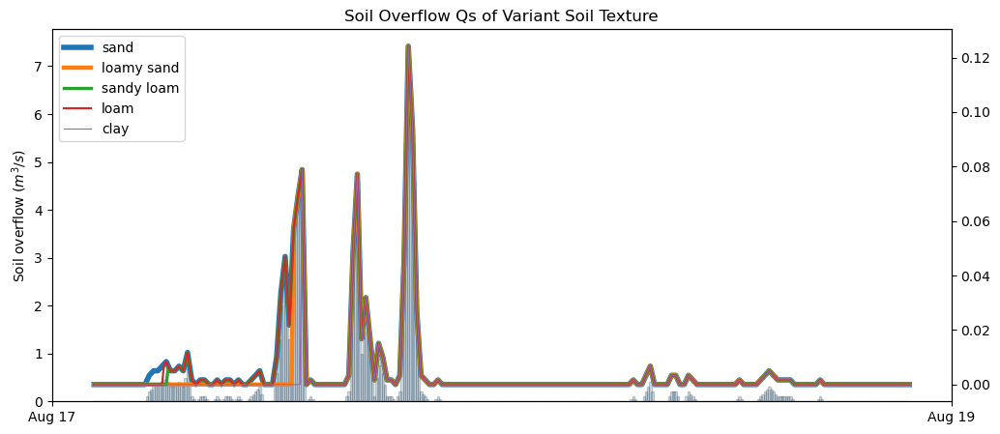

In [202]:
fig, ax = plt.subplots(figsize=(12,5))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %d"))
ax.bar(df_tests5['time'], df_tests5['precp'], edgecolor='black', width=0.004, alpha = 0.2, label='Rainfall')
ax.set_title("Soil Overflow Qs of Variant Soil Texture")
# ax.set_ylabel("Rainfall Intensity (mm/10min)")

ax2 = ax.twinx()
for i,t in enumerate(soil):
    columnname = "Qs_"+t
    ax2.plot(df_tests5['time'], df_tests5[columnname], label=t, linewidth=4-0.8*i)
ax2.legend(loc="upper left")

ax.set_ylabel("Soil overflow ($m^3/s$)")

In [214]:
list(soil.keys())[0]

'sand'

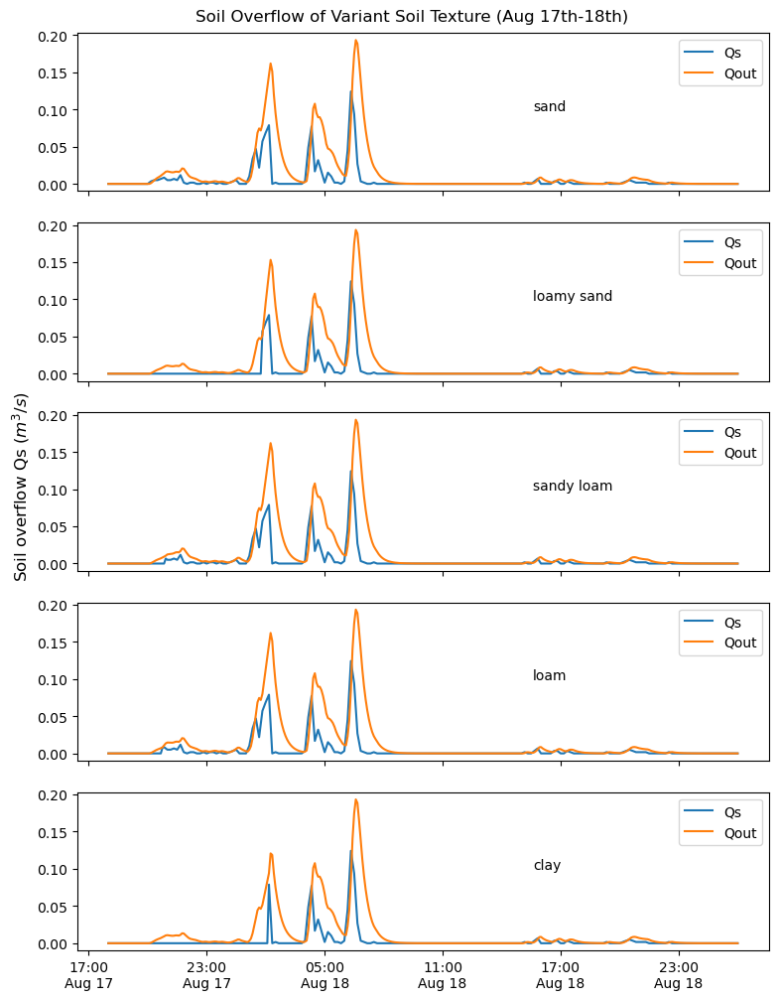

In [243]:
fig, axs = plt.subplots(5,1,figsize=(9,12), sharex=True, sharey=True)

for i, ax in enumerate(axs.flat):
    t = list(soil.keys())[i]
    columnname = "Qs_" + t
    ax.plot(df_tests5['time'], df_tests5[columnname], label="Qs")
    col_qout = "Qout_" + t

    ax.plot(df_tests5['time'], df_tests5[col_qout], label="Qout")
    ax.legend(loc="upper right")
    x_text_position = df_tests5['time'][9400]
    y_text_position = df_tests5[columnname].max() * 0.8  # 在最大值下方放置文本
    ax.text(x=x_text_position, y=y_text_position, s=t)
    # ax.text(x=0,y=0,s="sand")

fig.suptitle("Soil Overflow of Variant Soil Texture (Aug 17th-18th)", x=0.5, y=0.9)
fig.supylabel("Soil overflow Qs ($m^3/s$)",x=0.05)
plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=6))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:00\n%b %d'))

Text(0, 0.5, 'Accumulated discharge ($m^3/s$)')

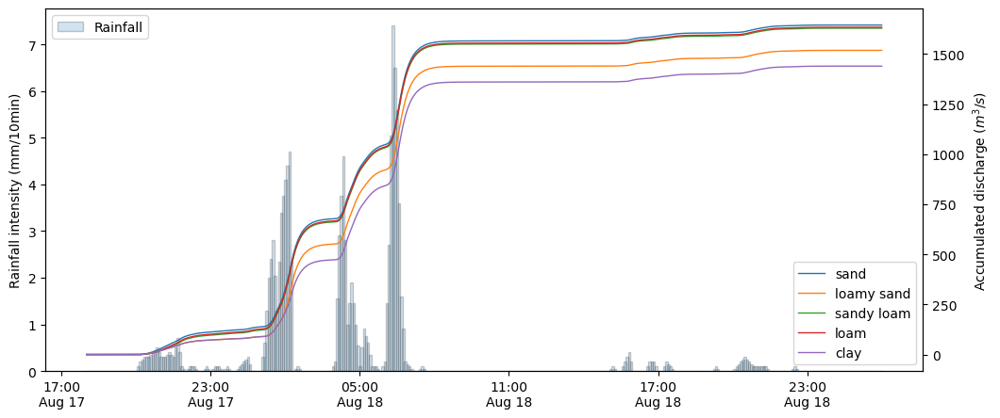

In [248]:
fig, ax = plt.subplots(figsize=(12,5))
ax.xaxis.set_major_locator(mdates.HourLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:00\n%b %d"))
ax.bar(df_tests5['time'], df_tests5['precp'], edgecolor='black', width=0.004, alpha = 0.2, label='Rainfall')
# ax.set_title("Sensitivity Analysis over Time Constant K")
ax.set_ylabel("Rainfall intensity (mm/10min)")
# ax.legend(loc="upper left")
ax2 = ax.twinx()
for t in texture:
    columnname = "Qout_"+t
    ax2.plot(df_tests5['time'], df_tests5[columnname].cumsum()*300, label=t, linewidth=1)

ax.legend(loc="upper left")
ax2.legend(loc="lower right")
ax2.set_ylabel("Accumulated discharge ($m^3/s$)")

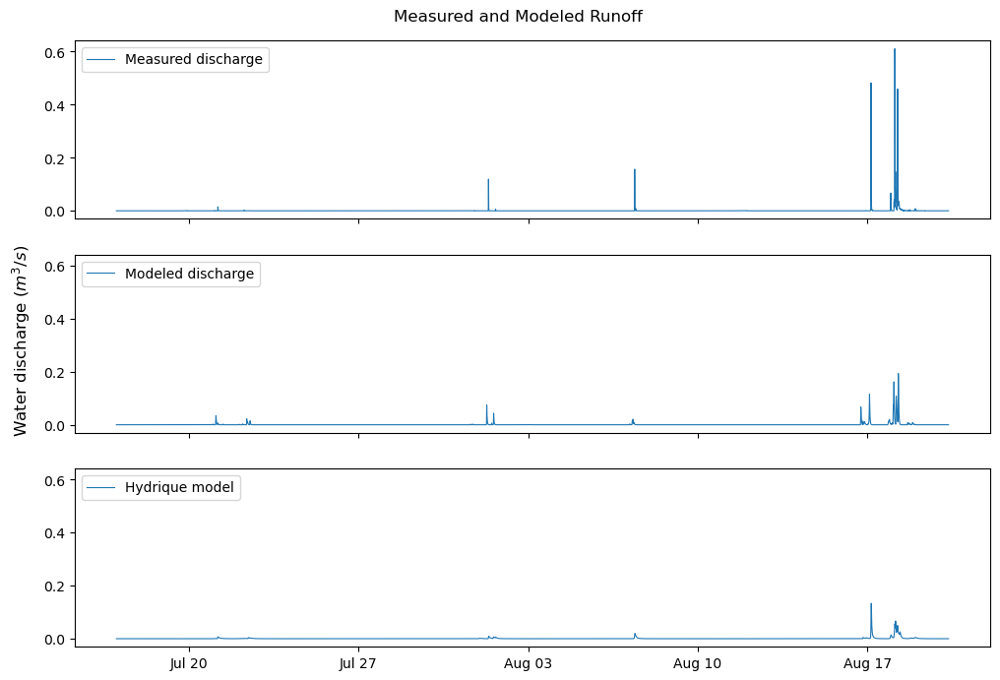

In [265]:
fig, axs = plt.subplots(3,1, sharex=True, sharey=True, figsize=(12,8))

# axs[0].plot(df_st_base['time'], df_st_base['precp'], label="Rainfall")
# ax.bar(df_st_base['time'], df_st_base['precp'], width=0.05, alpha = 0.6, label='Rainfall')
# ax.legend()
# ax.set_ylabel("Rainfall intensity (mm/10min)")
axs[0].plot(df_st_base['time'], df_st_base['discharge_de_shift'], label="Measured discharge", linewidth=0.8)
axs[1].plot(df_st_base['time'], df_st_base['Qout'], label="Modeled discharge", linewidth=0.8)
axs[2].plot(df_st_base['time'], df_st_base['Stormwater'], label="Hydrique model", linewidth=0.8)
# ax2.legend(bbox_to_anchor=(0.21, 0.9))
# ax2.set_ylabel("Water discharge ($m^3/s$)")
# ax.set_title("Modeled Discharge of Swisstech01 Subcatchment")
for i, ax in enumerate(axs.flat):
    ax.legend(loc="upper left")
fig.suptitle("Measured and Modeled Runoff", y=0.92)
fig.supylabel("Water discharge ($m^3/s$)", x=0.07)
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=7))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%b %d"))

In [267]:
area_tt = sum(omega0_st)+sum(omegas_st)+sum(omegat_st)

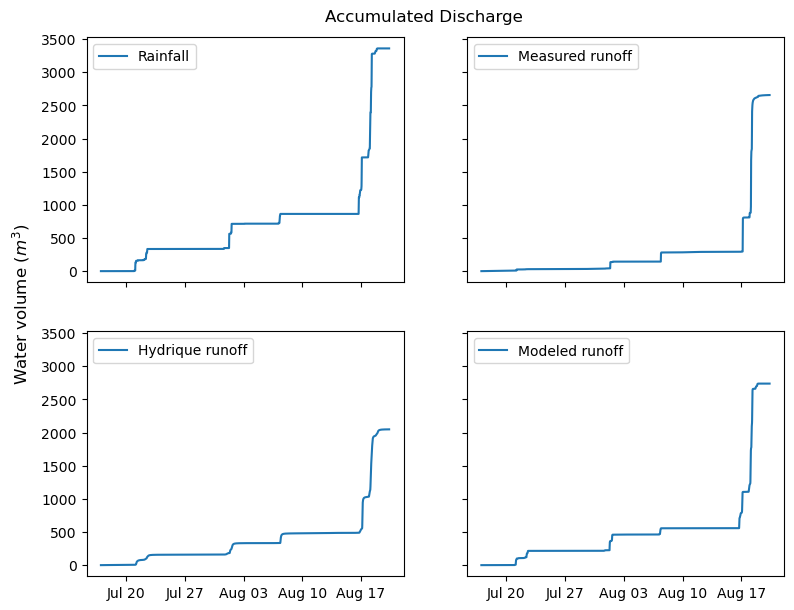

In [286]:
fig, axs = plt.subplots(2,2, sharex=True, sharey=True, figsize=(9,7))

axs[0,0].plot(df_st_base['time'], df_st_base['precp'].cumsum()*0.5*area_tt/1000, label="Rainfall")
axs[0,1].plot(df_st_base['time'], df_st_base['discharge_de_shift'].cumsum()*300, label="Measured runoff")
axs[1,0].plot(df_st_base['time'], df_st_base['Stormwater'].cumsum()*300, label="Hydrique runoff")
axs[1,1].plot(df_st_base['time'], df_st_base['Qout'].cumsum()*300, label="Modeled runoff")

for ax in axs.flat:
    ax.legend(loc="upper left")

fig.suptitle("Accumulated Discharge", y=0.92)
fig.supylabel("Water volume ($m^3$)", x=0.04)
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=7))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%b %d"))

Text(0.5, 1.0, 'Accumulated Discharge')

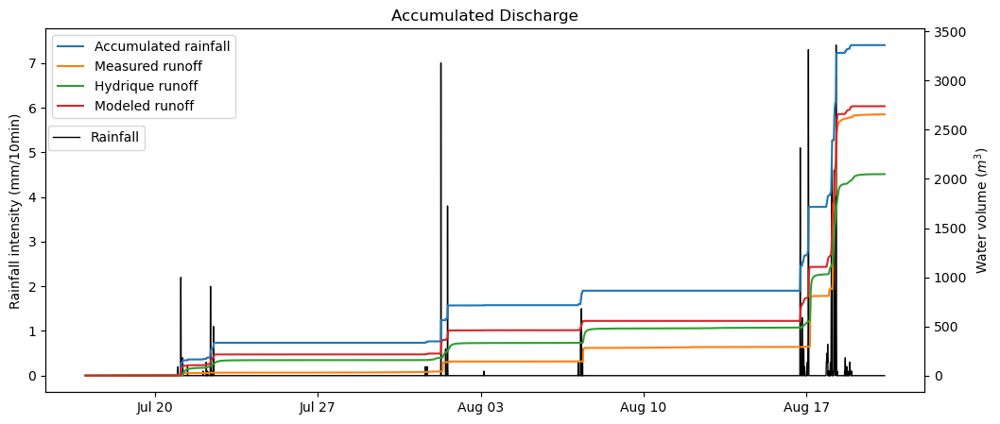

In [295]:
fig, ax = plt.subplots(figsize=(12,5))
ax.plot(df_st_base['time'], df_st_base['precp'], linewidth=1, color="black", label="Rainfall")
ax.set_ylabel("Rainfall intensity (mm/10min)")
ax.legend(bbox_to_anchor=(0.12,0.75))
ax2 = ax.twinx()
ax2.plot(df_st_base['time'], df_st_base['precp'].cumsum()*0.5*area_tt/1000, label="Accumulated rainfall")
ax2.plot(df_st_base['time'], df_st_base['discharge_de_shift'].cumsum()*300, label="Measured runoff")
ax2.plot(df_st_base['time'], df_st_base['Stormwater'].cumsum()*300, label="Hydrique runoff")
ax2.plot(df_st_base['time'], df_st_base['Qout'].cumsum()*300, label="Modeled runoff")
ax2.set_ylabel("Water volume ($m^3$)")

ax2.legend(loc="upper left")
ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %d"))
ax.set_title("Accumulated Discharge")

In [51]:
source1 = ColumnDataSource(df_st_base)
# Create a new plot with a title and axis labels
p = figure(title="Swisstech", x_axis_type="datetime",x_axis_label='Date', y_axis_label='Rainfall intensity (mm/10min)', width =1000)

# Add the first line (linked to the default primary y-axis)
# p.line('time', 'precp',source=source1, legend_label="Rainfall", line_color="blue", line_width=0.5)
p.vbar(x='time', top='precp', width=1000, source=source1, color='navy', alpha=0.6, legend_label="Rainfall")

# Add a second y-axis to the plot
p.extra_y_ranges = {"test": Range1d(start=0, end=np.max(df_st_base['Qout']+0.05))}
p.add_layout(LinearAxis(y_range_name="test", axis_label='Water Discharge (m^3/s)'), 'right')

# Add the second line (linked to the secondary y-axis)
p.line('time', 'Qout', source=source1, legend_label="Modeled", line_color="green", line_width=2, y_range_name="test")
p.line('time', 'discharge_de_shift', source=source1, legend_label="Measured", line_color="red", line_width=2, y_range_name="test")
# p.line('time', 'Stormwater', source=source1, legend_label="Stormwater", line_color="purple", line_width=2, y_range_name="test")
# p.line('time', 'Simulation', source=source1, legend_label="Simulation", line_color="black", line_width=2, y_range_name="test")
# p.line('time', 'Qs', source=source1, legend_label="Qs", line_color="pink", line_width=2, y_range_name="test")
p.legend.location="top_left"
# Show the plot
show(p)


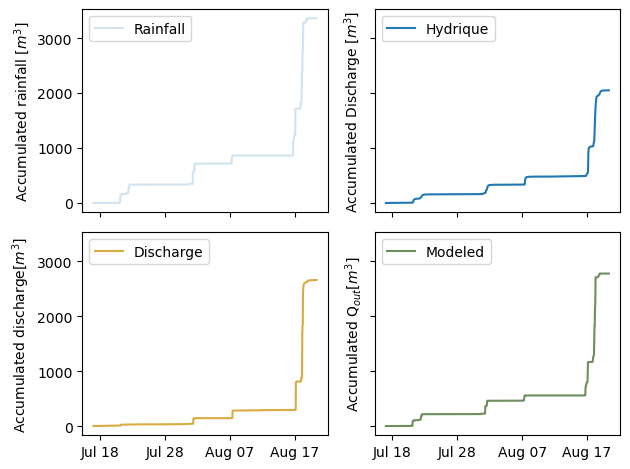

In [59]:
lagging = 0
k_st = 100
rt2s = 0.5

df_st_base = model_st(df_swstch, k=k_st, lag=lagging, frac_rt2s=rt2s)
# df_st_base

fig, ax = plt.subplots(2,2, sharex=True, sharey=True)

plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=10))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
# plt.xticks(rotation=45)

area_tt = sum(omega0_st)+sum(omegat_st)+sum(omegas_st)
area_imp = sum(omega0_st)+rt2s*sum(omegat_st)

ax[0,0].plot(df_st_base['time'], df_st_base['precp'].cumsum()*0.5*area_tt/1000, alpha = 0.2, label='Rainfall')
ax[0,0].legend(loc='upper left')
ax[0,0].set_ylabel('Accumulated rainfall [$m^3$]')
# ax.set_xticks(overlap['time'][::6])  
# ax.set_xticklabels(overlap['time'][::6].dt.strftime("%H:%M"), rotation=45, ha='right')

ax[0,1].plot(df_st_base['time'], df_st_base['Stormwater'].cumsum()*300, label='Hydrique')
ax[0,1].legend(loc='upper left')
ax[0,1].set_ylabel('Accumulated Discharge $[m^3]$')

ax[1,1].plot(df_st_base['time'], df_st_base['Qout'].cumsum()*300, label='Modeled', color='#6D8E5D')
ax[1,1].legend(loc='upper left')
ax[1,1].set_ylabel('Accumulated Q$_{out} [m^3]$')

# ax[0, 1].get_shared_y_axes().join(ax[0, 1], ax[1, 1])

# ax[1,0].plot(df_swstch['time'], simulated_st[6], label='Qs_accu', color='#D9AB42')
# ax[1,0].legend(loc='upper left')
# ax[1,0].set_ylabel('Accumulated Q$_{s} [m^3]$')

ax[1,0].plot(df_st_base['time'], df_st_base['discharge_de_shift'].cumsum()*300, label='Discharge', color='#D9AB42')
ax[1,0].legend(loc='upper left')
ax[1,0].set_ylabel('Accumulated discharge$[m^3]$')

V_h = max(df_st_base['Stormwater'].cumsum()*300)
V_m = max(df_st_base['Qout'].cumsum()*300)
V_p = max(df_st_base['precp'].cumsum()*0.5*area_tt/1000)
V_d = max(df_st_base['discharge_de_shift'].cumsum()*300)

# fig.text(0, -0.15,f"Rainfall to modeled discharge = {V_p/V_m}\n\
# Discharge from water level/ modeled discharge = {V_d/V_m}\n\
# nash-sutcliffe: {nash_sutcliffe(df_st_base['discharge_de_shift'], df_st_base['Qout'])}\n\
# lagging: {0*10/60}h \n\
# k = {k_st} /day")

plt.tight_layout()
plt.show()

In [27]:
lastweek_start = '2024-08-17 18:00:00'
lastweek_end = '2024-08-18 12:00:00'
lastweek = slicing(test1, lastweek_start, lastweek_end)

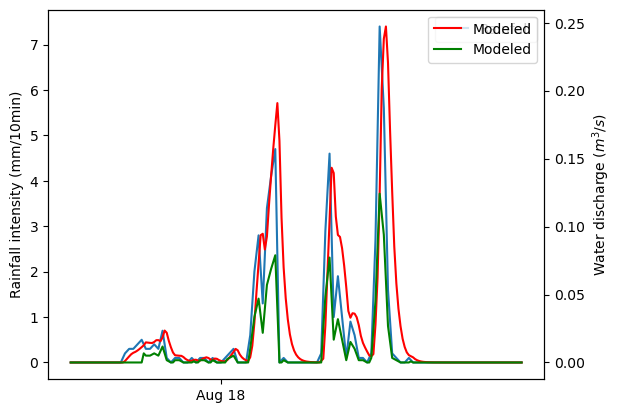

In [28]:
fig, ax = plt.subplots()
ax.plot(lastweek.index, lastweek['rre150z0'], label="Rainfall")
ax.legend()
ax.set_ylabel("Rainfall intensity (mm/10min)")
ax2 = ax.twinx()
ax2.plot(lastweek.index, lastweek['Qout'], label="Modeled", color='red')
ax2.plot(lastweek.index, lastweek['Qs'], label="Qs", color='green')
ax2.legend()
ax2.set_ylabel("Water discharge ($m^3/s$)")
# ax.xaxis.set_minor_locator(mdates.HourLocator(interval=12))
# ax.xaxis.set_minor_formatter(mdates.DateFormatter('%H'))
ax.xaxis.set_major_locator(mdates.DayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))

### 4.3 First change

In [17]:
infiltration = 6.7*10**(-6)  #[m/s]
Qmax = infiltration*sum(omegas_st)
Qmax

0.026386007

In [18]:
def model_st3(df, k=100, frac_rt2s=0.5, frac_rt2tk=1, Z_root=70, E_max=0.5, E_w=0.0625, soiltype="loamy sand",\
        omegas=sum(omegas_st), omega0=sum(omega0_st), omegat=sum(omegat_st), hmax=0.1, heavy=infiltration, lag=0, resolution=5, qp='linear', qp_value=0, kp=0):
    
    rain = df['precp'].fillna(0)
    rain_lag = rain if lag==0 else np.concatenate((np.zeros(lag), rain[:-lag]))


     # Soil parameters
    Ks = soil[soiltype]['Ks']
    n = soil[soiltype]['n']
    beta = soil[soiltype]['beta']
    s_h = soil[soiltype]['sh']
    s_w = soil[soiltype]['sw']
    s_s = soil[soiltype]['ss']
    s_fc = soil[soiltype]['sfc']
    # Initialization
    y_result = np.zeros((df.shape[0], 3))
    y0 = [0, s_s, 0]
    y_result[0] = y0
    dydt = np.zeros(3)
    Qs = np.zeros(df.shape[0])
    Qout = np.zeros(df.shape[0])
    Qt = np.zeros(df.shape[0])
    Qr = np.zeros(df.shape[0])
    Qp = np.zeros(df.shape[0])
    Qp2s = np.zeros(df.shape[0])
    Qpmax = heavy*omegas
    Vtmax = hmax*frac_rt2tk*omegat

    for i in range(df.shape[0]-1):
        p = rain_lag[i]/(1000*10*60) #convert from mm/10min to m/s

        #============ Qs ===============#
        if y_result[i,1] >= s_fc:
            Qs[i] = p * (omegas + (1-frac_rt2tk)*frac_rt2s*omegat)
        elif p>heavy:
            Qs[i] = (p-heavy)*(omegas + (1-frac_rt2tk)*frac_rt2s*omegat)
        else:
            Qs[i] = 0

        #============ Qr ===============#
        V_runoff = y_result[i,0]*omega0 # Water volume of V0 reservoir at time point i
        Qr[i] = k * V_runoff / 86400 # Turn k [/day] to k [/s]

        #============ Qt =================#
        Vt = frac_rt2tk*omegat*y_result[i, 2]
        Qt[i] = p*frac_rt2tk*omegat if (Vt>Vtmax) else 0

        #============ Qp =================#
        if p==0:
            if qp=="linear" and y_result[i,2]>=0:
                Qp[i] = qp_value
            else:
                Qp[i] = min(kp*y_result[i, 2]*frac_rt2tk*omegat, Qpmax)
                # Qp[i] = min(kp*y_result[i, 2], Qpmax)

        #============ Qout =================#
        Qout[i] = Qt[i] + Qr[i]
        #==============Road reservoir==========#
        dydt[0] = (p*(omega0+(1-frac_rt2tk)*(1-frac_rt2s)*omegat) + Qs[i] - Qr[i])/omega0
        
        y_result[i+1, 0] = y_result[i, 0] + dydt[0]*60*resolution # tspan resolution is 10 min = 600s
        if y_result[i+1, 0] < 0:
            y_result[i+1, 0] = 0
        #==============Soil reservoir==========#
        Z_soil = n*Z_root
        Qp2s[i] = Qp[i] if y_result[i, 1]<s_fc else 0
        # dydt[1] = p*(1+(1-frac_rt2tk)*frac_rt2s*omegat/omegas)/ (Z_soil / 100) + Qp2s[i]/(Z_soil/100) \
        #          - rho(y_result[i, 1],n, Z_root, E_max, E_w, beta, s_h, s_w, s_s, s_fc, Ks) / 86400
        
        dydt[1] = p*(1+(1-frac_rt2tk)*frac_rt2s*omegat/omegas)/ (Z_soil / 100) + \
                 - rho(y_result[i, 1],n, Z_root, E_max, E_w, beta, s_h, s_w, s_s, s_fc, Ks) / 86400

        y_result[i+1, 1] = y_result[i, 1] + dydt[1]*60*resolution
        if y_result[i+1, 1] >= s_fc:
            y_result[i+1, 1] = s_fc
        #==============Tank reservoir==========#
        if frac_rt2tk != 0:
            dydt[2] = p - (Qt[i]+Qp2s[i])/(frac_rt2tk*omegat)

            y_result[i+1, 2] = y_result[i, 2] + dydt[2]*60*resolution
            # hmax = Vtmax/(frac_rt2tk*omegat)
            if y_result[i+1, 2] >= hmax:
                y_result[i+1, 2] = hmax
        else:
            dydt[2] = 0
            y_result[i, 2] = 0

        
    df_return = df.copy()
    df_return['Qout'] = Qout
    df_return['Qs'] = Qs
    df_return['Qt'] = Qt
    df_return['Qr'] = Qr
    df_return['Qp'] = Qp
    df_return['soil_mois'] = y_result[:,1]
    df_return['h_tank'] = y_result[:,2]

    return df_return

In [9]:
sum(omegat_st)

12261.71

In [10]:
sum(omegat_st)/(sum(omega0_st)+sum(omegat_st)+sum(omegas_st))

0.433216117490481

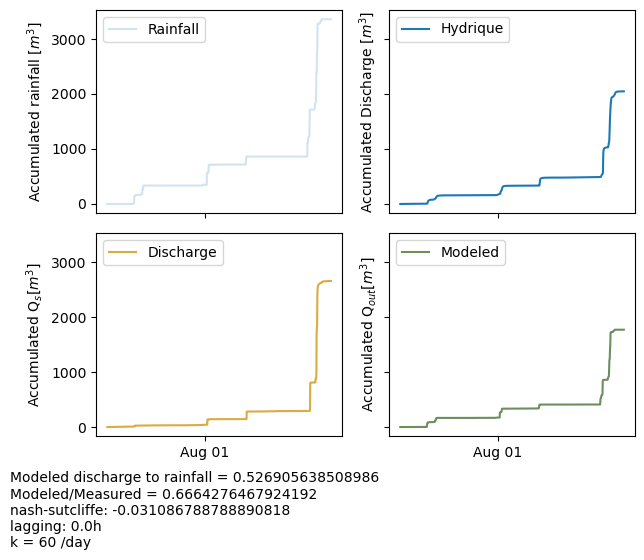

In [15]:
lagging = 0
k_st = 60
rt2s = 0.5
rt2tk = 1
df_st3 = model_st3(df_swstch, k=k_st, lag=lagging, frac_rt2s=rt2s, hmax=0.1, frac_rt2tk=rt2tk, qp="", qp_value=0.0001, kp=0.01)
# df_st_base

fig, ax = plt.subplots(2,2, sharex=True, sharey=True)

plt.gca().xaxis.set_major_locator(mdates.MonthLocator(bymonthday=1))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
# plt.xticks(rotation=45)
    
area_tt = sum(omega0_st)+sum(omegat_st)+sum(omegas_st)
area_imp = sum(omega0_st)+rt2s*sum(omegat_st)

ax[0,0].plot(df_st3['time'], df_st3['precp'].cumsum()*0.5*area_tt/1000, alpha = 0.2, label='Rainfall')
ax[0,0].legend(loc='upper left')
ax[0,0].set_ylabel('Accumulated rainfall [$m^3$]')
# ax.set_xticks(overlap['time'][::6])  
# ax.set_xticklabels(overlap['time'][::6].dt.strftime("%H:%M"), rotation=45, ha='right')

ax[0,1].plot(df_st3['time'], df_st3['Stormwater'].cumsum()*300, label='Hydrique')
ax[0,1].legend(loc='upper left')
ax[0,1].set_ylabel('Accumulated Discharge $[m^3]$')

ax[1,1].plot(df_st3['time'], df_st3['Qout'].cumsum()*300, label='Modeled', color='#6D8E5D')
ax[1,1].legend(loc='upper left')
ax[1,1].set_ylabel('Accumulated Q$_{out} [m^3]$')

# ax[0, 1].get_shared_y_axes().join(ax[0, 1], ax[1, 1])

# ax[1,0].plot(df_swstch['time'], simulated_st[6], label='Qs_accu', color='#D9AB42')
# ax[1,0].legend(loc='upper left')
# ax[1,0].set_ylabel('Accumulated Q$_{s} [m^3]$')

ax[1,0].plot(df_st3['time'], df_st3['discharge_de_shift'].cumsum()*300, label='Discharge', color='#D9AB42')
ax[1,0].legend(loc='upper left')
ax[1,0].set_ylabel('Accumulated Q$_{s} [m^3]$')

V_h = max(df_st3['Stormwater'].cumsum()*300)
V_m = max(df_st3['Qout'].cumsum()*300)
V_p = max(df_st3['precp'].cumsum()*0.5*area_tt/1000)
V_d = max(df_st3['discharge_de_shift'].cumsum()*300)

fig.text(0, -0.15,f"Modeled discharge to rainfall = {V_m/V_p}\n\
Modeled/Measured = {V_m/V_d}\n\
nash-sutcliffe: {nash_sutcliffe(df_st3['discharge_de_shift'], df_st3['Qout'])}\n\
lagging: {lagging*5/60}h \n\
k = {k_st} /day")

plt.tight_layout()
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))

In [154]:
from bokeh.plotting import figure, show
from bokeh.models import LinearAxis, Range1d
source1 = ColumnDataSource(df_st3)
# Create a new plot with a title and axis labels
tool=("box_zoom", "wheel_zoom", "save", "reset", "pan","hover")
p = figure(title="Swisstech", x_axis_type="datetime",x_axis_label='Date', y_axis_label='Rainfall intensity (mm/10min)', width =1000, tools=tool)

hover = HoverTool(
    tooltips=[
        ("Date", "@time{%b %d %H:%M}"),  # 正确的日期格式
        ("Rainfall", "@precp mm"),
        ("Qout", "@Qout m^3/s")
    ],
    formatters={
        '@time': 'datetime'  # 告诉 Bokeh 解释为 datetime
    },
    mode='mouse'
)

# 将 HoverTool 添加到图形中
p.add_tools(hover)



# Add the first line (linked to the default primary y-axis)
# p.line('time', 'precp',source=source1, legend_label="Rainfall", line_color="blue", line_width=0.5)
p.vbar(x='time', top='precp', width=0.5, source=source1, color='navy', alpha=0.6)

# Add a second y-axis to the plot
p.extra_y_ranges = {"test": Range1d(start=0, end=np.max(df_st3['Qout']+0.05)), \
    "height": Range1d(start=0, end=np.max(df_st3['h_tank'])+0.05)}
# p.add_layout(LinearAxis(y_range_name="test", axis_label='Water Discharge (m^3/s)'), 'right')
p.add_layout(LinearAxis(y_range_name="test", axis_label='discharge'), 'right')

# Add the second line (linked to the secondary y-axis)
p.line('time', 'Qout', source=source1, legend_label="Modeled", line_color="green", line_width=2, y_range_name="test")
# p.line('time', 'discharge_de_shift', source=source1, legend_label="Measured", line_color="red", line_width=2, y_range_name="test")
# p.line('time', 'Stormwater', source=source1, legend_label="Stormwater", line_color="purple", line_width=2, y_range_name="test")
# p.line('time', 'Simulation', source=source1, legend_label="Simulation", line_color="black", line_width=2, y_range_name="test")
p.line('time', 'Qs', source=source1, legend_label="Qs", line_color="pink", line_width=2, y_range_name="test")
# p.line('time', 'h_tank', source=source1, legend_label="h_tank", line_color="violet", line_width=2, y_range_name="height")
p.line('time', 'Qt', source=source1, legend_label="Qt", line_color="red", line_width=2, y_range_name="test")
p.legend.location="top_left"
# Show the plot
show(p)


In [161]:
from bokeh.plotting import figure, show
from bokeh.models import LinearAxis, Range1d
source1 = ColumnDataSource(df_st3)
# Create a new plot with a title and axis labels
tool=("box_zoom", "wheel_zoom", "save", "reset", "pan","hover")
p = figure(title="Swisstech", x_axis_type="datetime",x_axis_label='Date', y_axis_label='Rainfall intensity (mm/10min)', width =1000, tools=tool, tooltips="@time{%b %d %H:%M}, @y")

hover = HoverTool(
    tooltips=[
        ("Date", "@time{%b %d %H:%M}"),  # 正确的日期格式
        ("Rainfall", "@precp mm"),
        ("Qout", "@Qout m^3/s")
    ],
    formatters={
        '@time': 'datetime'  # 告诉 Bokeh 解释为 datetime
    },
    mode='mouse'
)

# 将 HoverTool 添加到图形中
p.add_tools(hover)



# Add the first line (linked to the default primary y-axis)
# p.line('time', 'precp',source=source1, legend_label="Rainfall", line_color="blue", line_width=0.5)
p.vbar(x='time', top='precp', width=0.5, source=source1, color='navy', alpha=0.6)

# Add a second y-axis to the plot
p.extra_y_ranges = {"test": Range1d(start=0, end=np.max(df_st3['Qout']+0.05)), \
    "height": Range1d(start=np.min(df_st3['h_tank']), end=np.max(df_st3['h_tank'])+0.05)}
p.add_layout(LinearAxis(y_range_name="test", axis_label='Water Discharge (m^3/s)'), 'right')
# p.add_layout(LinearAxis(y_range_name="height", axis_label='h_tank'), 'right')

# Add the second line (linked to the secondary y-axis)
p.line('time', 'Qout', source=source1, legend_label="Modeled", line_color="green", line_width=2, y_range_name="test")
# p.line('time', 'discharge_de_shift', source=source1, legend_label="Measured", line_color="red", line_width=2, y_range_name="test")
# p.line('time', 'Stormwater', source=source1, legend_label="Stormwater", line_color="purple", line_width=2, y_range_name="test")
# p.line('time', 'Simulation', source=source1, legend_label="Simulation", line_color="black", line_width=2, y_range_name="test")
# p.line('time', 'Qs', source=source1, legend_label="Qs", line_color="pink", line_width=2, y_range_name="test")
# p.line('time', 'h_tank', source=source1, legend_label="h_tank", line_color="violet", line_width=2, y_range_name="height")
p.line('time', 'Qs', source=source1, legend_label="Qt", line_color="red", line_width=2, y_range_name="test")
p.legend.location="top_left"
# Show the plot
show(p)

p1: constant use (linear) boundary limit
p2: proportional to the volume (kh)

Why not discharge during rianfall?

In [126]:
np.max(df_st3['h_tank'])

0.04077734671591483

In [122]:
sum(np.max(df_st3['h_tank'])*omegat_st)

500.00000000000006

In [43]:
df_st3_accum = df_st3.copy()
df_st3_accum['precp_accu'] = df_st3['precp'].cumsum()*0.5*area_tt/1000
df_st3_accum['Qout_accu'] = df_st3['Qout'].cumsum()*300
df_st3_accum['discharge_accu'] = df_st3['discharge_de_shift'].cumsum()*300

In [44]:
from bokeh.plotting import figure, show
from bokeh.models import LinearAxis, Range1d
source1 = ColumnDataSource(df_st3_accum)
# Create a new plot with a title and axis labels
p = figure(title="Swisstech_cumulative", x_axis_type="datetime",x_axis_label='Date', y_axis_label='Accumulated volume ($m^3$)', width =1000)

# Add the first line (linked to the default primary y-axis)
# p.line('time', 'precp',source=source1, legend_label="Rainfall", line_color="blue", line_width=0.5)
p.line('time', 'precp_accu', source=source1, legend_label="Rain", line_color="violet", line_width=2)
p.line('time', 'Qout_accu', source=source1, legend_label="Modeled", line_color="brown", line_width=2)
p.line('time', 'discharge_accu', source=source1, legend_label="Measured", line_color="black", line_width=2)
# p.line('time', 'Qt', source=source1, legend_label="Qs", line_color="pink", line_width=2, y_range_name="test")
p.legend.location="top_left"
show(p)

In [226]:
startp1 = "2024-08-17 20:00:00"
endp1 = "2024-08-17 22:00:00"
startd1 = "2024-08-17 22:00:00"
endd1 = "2024-08-18 00:00:00"
startp2 = "2024-08-18 01:00:00"
endp2 = "2024-08-18 02:30:00"
startd2 = "2024-08-18 02:00:00"
endd2 = "2024-08-18 05:30:00"
startp3 = "2024-08-18 04:00:00"
endp3 = "2024-08-18 06:00:00"
startd3 = "2024-08-18 05:30:00"
endd3 = "2024-08-18 8:00:00"

In [231]:
precp1 =  df_swstch.loc[(df_swstch['time'] >= startp1) & (df_swstch['time'] <= endp1), 'precp'].sum()*0.5*area_tt/1000
precp2 =  df_swstch.loc[(df_swstch['time'] >= startp2) & (df_swstch['time'] <= endp2), 'precp'].sum()*0.5*area_tt/1000
precp3 =  df_swstch.loc[(df_swstch['time'] >= startp3) & (df_swstch['time'] <= endp3), 'precp'].sum()*0.5*area_tt/1000
discharge1 = df_swstch.loc[(df_swstch['time'] >= startd1) & (df_swstch['time'] <= endd1), 'discharge_de_shift'].sum()*300
discharge2 = df_swstch.loc[(df_swstch['time'] >= startd2) & (df_swstch['time'] <= endd2), 'discharge_de_shift'].sum()*300
discharge3 = df_swstch.loc[(df_swstch['time'] >= startd3) & (df_swstch['time'] <= endd3), 'discharge_de_shift'].sum()*300

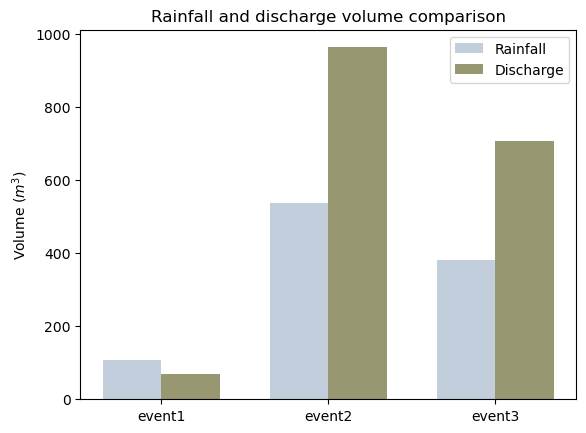

In [241]:
x = ['event1', 'event2', 'event3']  # x 轴的标签 (0, 1, 2, 3, 4)
y1 = [precp1, precp2, precp3]  # 第一个数组
y2 = [discharge1, discharge2, discharge3]  # 第二个数组

# 设置条形宽度
bar_width = 0.35  # 条形的宽度
x_indices = np.arange(len(x))  # x 轴的索引

# 绘制第一个条形图
plt.bar(x_indices, y1, width=bar_width, label='Rainfall', color='#C2CEDC')

# 绘制第二个条形图，并将其向右偏移
plt.bar(x_indices + bar_width, y2, width=bar_width, label='Discharge', color='#979771')

# 添加图例
plt.legend()

# 添加标题和标签
plt.title('Rainfall and discharge volume comparison')
# plt.xlabel('X Axis')
plt.ylabel('Volume ($m^3$)')

# 设置x轴的刻度
plt.xticks(x_indices + bar_width / 2, x)

# 显示图表
plt.show()


# 10yr

In [7]:
df_precp_10yr = pd.read_csv("D:/OneDrive - epfl.ch/Master_thesis/Scripts/precp_10yr/order_124645_data.txt", delimiter=";")
df_precp_10yr

C:\Users\whh\AppData\Local\Temp\ipykernel_18428\1698120459.py:1: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df_precp_10yr = pd.read_csv("D:/OneDrive - epfl.ch/Master_thesis/Scripts/precp_10yr/order_124645_data.txt", delimiter=";")


,stn,time,rre150z0
0,LSN,201401010000,0.0
1,LSN,201401010010,0.0
2,LSN,201401010020,0.1
3,LSN,201401010030,0.1
4,LSN,201401010040,0.1
...,...,...,...
525883,LSN,202312312310,0.0
525884,LSN,202312312320,0.0
525885,LSN,202312312330,0.0
525886,LSN,202312312340,0.0


In [8]:
df_precp_10yr['time'] = pd.to_datetime(df_precp_10yr['time'], format="%Y%m%d%H%M")
df_precp_10yr

,stn,time,rre150z0
0,LSN,2014-01-01 00:00:00,0.0
1,LSN,2014-01-01 00:10:00,0.0
2,LSN,2014-01-01 00:20:00,0.1
3,LSN,2014-01-01 00:30:00,0.1
4,LSN,2014-01-01 00:40:00,0.1
...,...,...,...
525883,LSN,2023-12-31 23:10:00,0.0
525884,LSN,2023-12-31 23:20:00,0.0
525885,LSN,2023-12-31 23:30:00,0.0
525886,LSN,2023-12-31 23:40:00,0.0


In [9]:
df_precp_10yr.rename(columns={"rre150z0": "precp"}, inplace=True)


In [10]:
df_precp_10yr['precp'] = df_precp_10yr['precp'].replace("-", 0)
df_precp_10yr

,stn,time,precp
0,LSN,2014-01-01 00:00:00,0.0
1,LSN,2014-01-01 00:10:00,0.0
2,LSN,2014-01-01 00:20:00,0.1
3,LSN,2014-01-01 00:30:00,0.1
4,LSN,2014-01-01 00:40:00,0.1
...,...,...,...
525883,LSN,2023-12-31 23:10:00,0.0
525884,LSN,2023-12-31 23:20:00,0.0
525885,LSN,2023-12-31 23:30:00,0.0
525886,LSN,2023-12-31 23:40:00,0.0


In [11]:
df_precp_10yr['precp'] = pd.to_numeric(df_precp_10yr['precp'])

In [12]:
df_precp_10yr

,stn,time,precp
0,LSN,2014-01-01 00:00:00,0.0
1,LSN,2014-01-01 00:10:00,0.0
2,LSN,2014-01-01 00:20:00,0.1
3,LSN,2014-01-01 00:30:00,0.1
4,LSN,2014-01-01 00:40:00,0.1
...,...,...,...
525883,LSN,2023-12-31 23:10:00,0.0
525884,LSN,2023-12-31 23:20:00,0.0
525885,LSN,2023-12-31 23:30:00,0.0
525886,LSN,2023-12-31 23:40:00,0.0


In [13]:
df_precp_10yr = dataresample(df_precp_10yr, "time", "5T")
df_precp_10yr.head()

,time,stn,precp
0,2014-01-01 00:00:00,LSN,0.00
1,2014-01-01 00:05:00,NaN,0.00
2,2014-01-01 00:10:00,LSN,0.00
3,2014-01-01 00:15:00,NaN,0.05
4,2014-01-01 00:20:00,LSN,0.10


In [14]:
df_precp_10yr.to_pickle("df_precp_10yr.pkl")

In [15]:
df_precp_10yr

,time,stn,precp
0,2014-01-01 00:00:00,LSN,0.00
1,2014-01-01 00:05:00,NaN,0.00
2,2014-01-01 00:10:00,LSN,0.00
3,2014-01-01 00:15:00,NaN,0.05
4,2014-01-01 00:20:00,LSN,0.10
...,...,...,...
1051770,2023-12-31 23:30:00,LSN,0.00
1051771,2023-12-31 23:35:00,NaN,0.00
1051772,2023-12-31 23:40:00,LSN,0.00
1051773,2023-12-31 23:45:00,NaN,0.00


In [16]:
df_st_10yr = model_st3(df_precp_10yr, qp="", kp=0.01/10000)

NameError: name 'model_st3' is not defined

In [52]:
sum(omegat_st)

12261.71

## First run

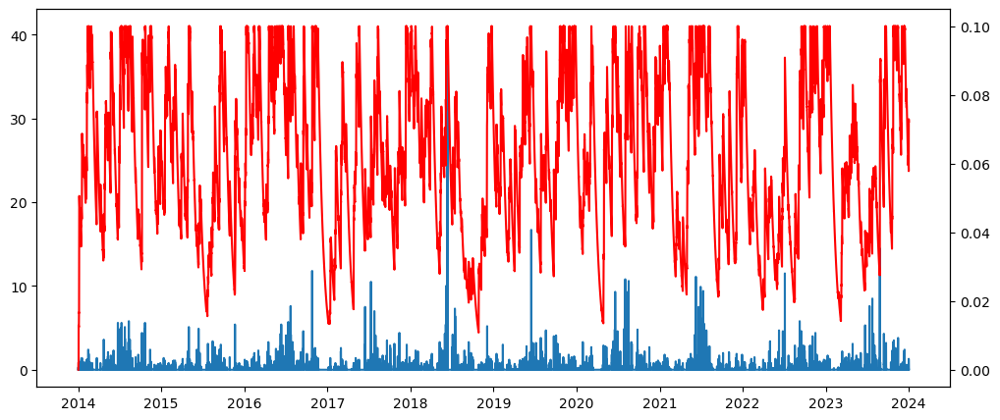

In [88]:
fig, ax = plt.subplots(figsize=(12,5))
ax.plot(df_st_10yr['time'], df_st_10yr['precp'], label='Rainfall')
ax2 = ax.twinx()
ax2.plot(df_st_10yr['time'], df_st_10yr['h_tank'], label='h_tank', color='red')

In [89]:
df_st_10yr[df_st_10yr['h_tank'] == 0.1]

,time,stn,precp,Qout,Qs,Qt,Qr,Qp,soil_mois,h_tank
11848,2014-02-11 03:20:00,LSN,0.30,0.010648,0.001969,0.0,0.010648,0.000000,0.580000,0.1
11849,2014-02-11 03:25:00,NaN,0.15,0.009736,0.000985,0.0,0.009736,0.000000,0.580000,0.1
11850,2014-02-11 03:30:00,LSN,0.00,0.007748,0.000000,0.0,0.007748,0.001226,0.580000,0.1
11851,2014-02-11 03:35:00,NaN,0.05,0.005058,0.000000,0.0,0.005058,0.000000,0.579945,0.1
11852,2014-02-11 03:40:00,LSN,0.10,0.003652,0.000000,0.0,0.003652,0.000000,0.579969,0.1
...,...,...,...,...,...,...,...,...,...,...
1046637,2023-12-14 03:45:00,NaN,0.15,0.002361,0.000985,0.0,0.002361,0.000000,0.580000,0.1
1046638,2023-12-14 03:50:00,LSN,0.20,0.002934,0.001313,0.0,0.002934,0.000000,0.580000,0.1
1046639,2023-12-14 03:55:00,NaN,0.10,0.003772,0.000656,0.0,0.003772,0.000000,0.580000,0.1
1046640,2023-12-14 04:00:00,LSN,0.00,0.003391,0.000000,0.0,0.003391,0.001226,0.580000,0.1


In [85]:
df_st_10yr[df_st_10yr['precp']!=0].shape[0]

76745

In [90]:
13286/76745

0.1731187699524399

In [20]:
df

,time,stn,precp,Qout,Qs,Qt,Qr,Qp,soil_mois,h_tank
0,2014-01-01 00:00:00,LSN,0.00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000,0.310000,0.000000
1,2014-01-01 00:05:00,NaN,0.00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000,0.309941,0.000000
2,2014-01-01 00:10:00,LSN,0.00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000,0.309882,0.000000
3,2014-01-01 00:15:00,NaN,0.05,0.000000e+00,0.0,0.0,0.000000e+00,0.000000,0.309823,0.000000
4,2014-01-01 00:20:00,LSN,0.10,3.502312e-04,0.0,0.0,3.502312e-04,0.000000,0.309849,0.000025
...,...,...,...,...,...,...,...,...,...,...
1051770,2023-12-31 23:30:00,LSN,0.00,5.147241e-15,0.0,0.0,5.147241e-15,0.000733,0.314323,0.051647
1051771,2023-12-31 23:35:00,NaN,0.00,3.360004e-15,0.0,0.0,3.360004e-15,0.000733,0.314264,0.051629
1051772,2023-12-31 23:40:00,LSN,0.00,2.193336e-15,0.0,0.0,2.193336e-15,0.000732,0.314205,0.051611
1051773,2023-12-31 23:45:00,NaN,0.00,1.431761e-15,0.0,0.0,1.431761e-15,0.000732,0.314146,0.051593


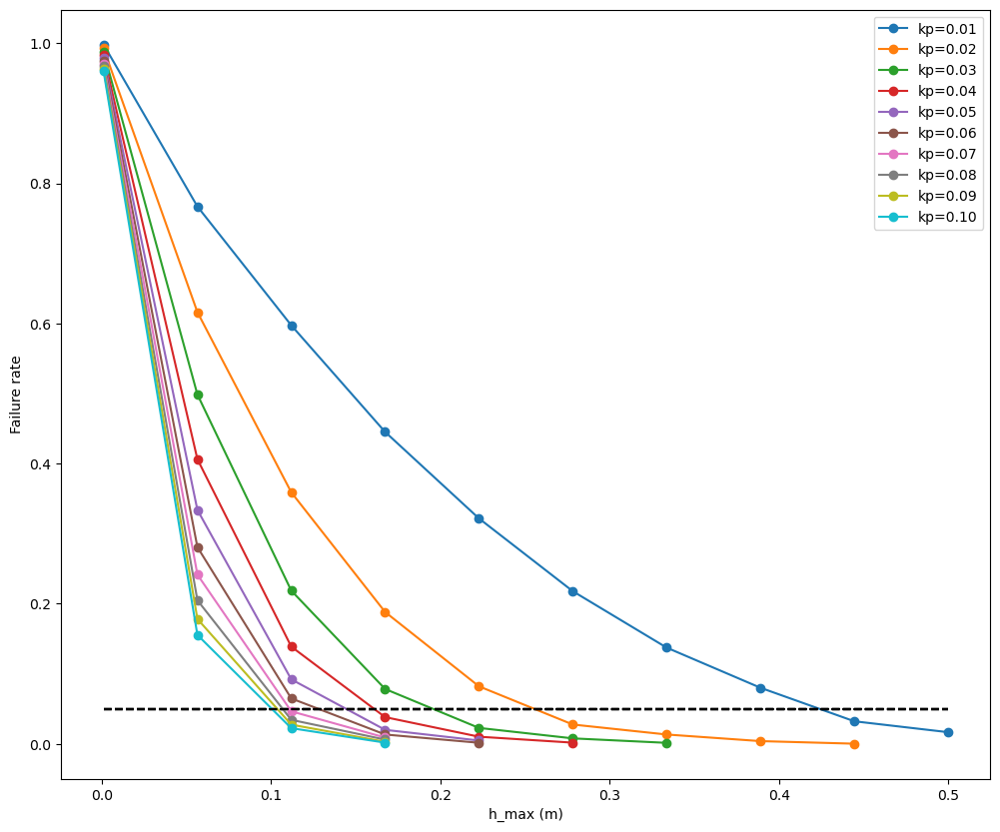

In [21]:
# rt2tk_range = np.linspace(0.1,1,3)
hmax_range = np.linspace(0.001,0.5,10)
kp_range = np.linspace(0.01,0.1,10)
fig, ax = plt.subplots(figsize=(12,10))

for k_p in kp_range:
    p_fail = []
    for h in hmax_range:
        # vtmax= rt2tk*sum(omegat_st)*hmax
        df = model_st3(df_precp_10yr, frac_rt2tk=1,hmax=h, qp="", kp=k_p/86400)
        time_fail = df[df['h_tank']==h].shape[0]
        time_rain = df[df['precp']!=0].shape[0]
        p_fail.append(time_fail/time_rain)

    p_fail = np.array(p_fail, dtype=float)  # 转换为 float 类型
    p_fail[p_fail == 0] = np.nan  # 将 0 替换为 NaN
    ax.plot(hmax_range, p_fail, label=f"kp={k_p:.2f}", marker='o')
    ax.hlines(y=0.05, xmin=np.min(hmax_range), xmax=np.max(hmax_range), linestyles='dashed', color='black')
    ax.legend()
    ax.set_xlabel("h_max (m)")
    ax.set_ylabel("Failure rate")


In [99]:
def count_value_segments(data, value):
    # count = 0
    in_segment = False
    lengths = []
    length = 0

    for x in data:
        if x == value:
            if not in_segment:
                in_segment = True
                length = 1
            else:
                length += 1
        else:
            if in_segment:
                lengths.append(length)
                in_segment=False

    if in_segment:
        lengths.append(length)

    return lengths

In [125]:
limit_times = count_value_segments(df_st_10yr['h_tank'], 0.1)
limit_times

[8,
 3,
 2,
 27,
 8,
 14,
 10,
 100,
 13,
 19,
 31,
 17,
 41,
 6,
 115,
 7,
 6,
 10,
 59,
 102,
 7,
 3,
 2,
 10,
 63,
 8,
 9,
 26,
 7,
 25,
 7,
 61,
 3,
 81,
 5,
 14,
 5,
 4,
 25,
 20,
 5,
 13,
 9,
 9,
 5,
 3,
 7,
 3,
 3,
 5,
 4,
 7,
 35,
 15,
 30,
 165,
 17,
 7,
 36,
 18,
 21,
 47,
 26,
 22,
 11,
 3,
 142,
 58,
 11,
 148,
 45,
 8,
 4,
 3,
 4,
 104,
 47,
 33,
 33,
 60,
 28,
 52,
 46,
 6,
 10,
 83,
 17,
 7,
 30,
 7,
 3,
 3,
 8,
 11,
 2,
 4,
 3,
 4,
 7,
 6,
 9,
 3,
 25,
 22,
 15,
 39,
 6,
 31,
 5,
 20,
 7,
 50,
 89,
 19,
 10,
 48,
 16,
 7,
 3,
 18,
 28,
 3,
 12,
 31,
 83,
 5,
 7,
 4,
 11,
 52,
 4,
 12,
 106,
 3,
 15,
 33,
 10,
 8,
 2,
 39,
 3,
 2,
 20,
 7,
 5,
 4,
 14,
 15,
 5,
 12,
 29,
 5,
 5,
 17,
 5,
 4,
 54,
 9,
 18,
 33,
 80,
 10,
 3,
 11,
 13,
 35,
 5,
 13,
 24,
 4,
 7,
 36,
 16,
 6,
 6,
 8,
 4,
 6,
 36,
 3,
 11,
 27,
 76,
 12,
 59,
 3,
 109,
 69,
 4,
 6,
 3,
 4,
 5,
 23,
 3,
 3,
 2,
 5,
 3,
 7,
 4,
 2,
 8,
 61,
 4,
 16,
 5,
 34,
 2,
 5,
 4,
 16,
 19,
 21,
 219,
 5,
 22,
 47,
 16,

In [126]:
limit_times = np.array(limit_times)
limit_times = limit_times*5

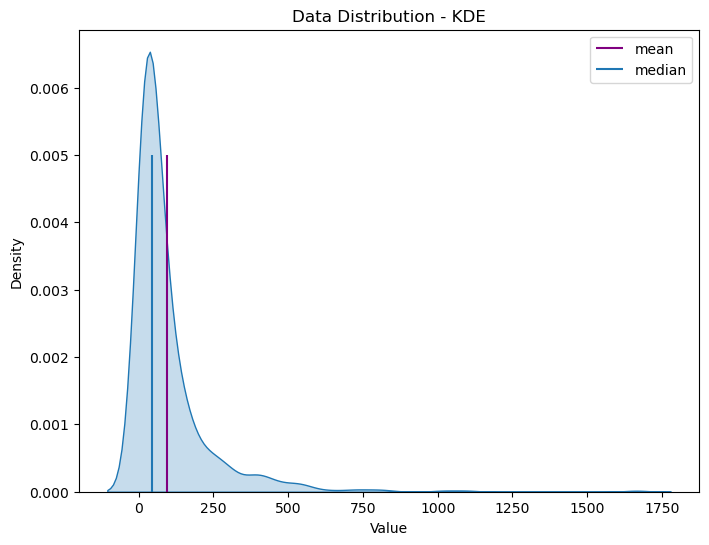

In [131]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_kde(data):
    # data = np.array(data)
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data, shade=True)
    plt.vlines(np.mean(data), ymin=0, ymax=0.005, label='mean', color='purple')
    plt.vlines(np.median(data), ymin=0, ymax=0.005, label='median')
    plt.title('Data Distribution - KDE')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend()
    plt.show()


plot_kde(limit_times)


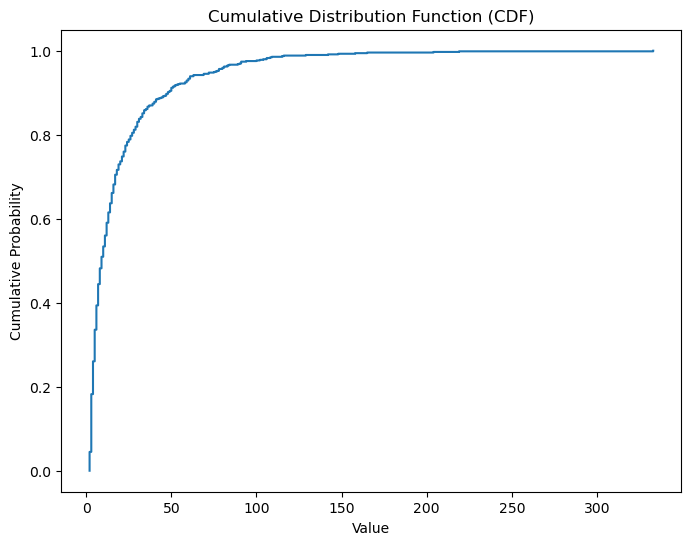

In [120]:
import numpy as np
import matplotlib.pyplot as plt

def plot_cdf(data):
    # 对数据进行排序并计算累积概率
    sorted_data = np.sort(data)
    cumulative_prob = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    
    plt.figure(figsize=(8, 6))
    plt.step(sorted_data, cumulative_prob, where="post")
    plt.title('Cumulative Distribution Function (CDF)')
    plt.xlabel('Value')
    plt.ylabel('Cumulative Probability')
    plt.show()

# 示例使用
data = [1, 2, 2, 3, 4, 4, 4, 5, 5, 6, 7, 8, 9, 10]
plot_cdf(limit_times)


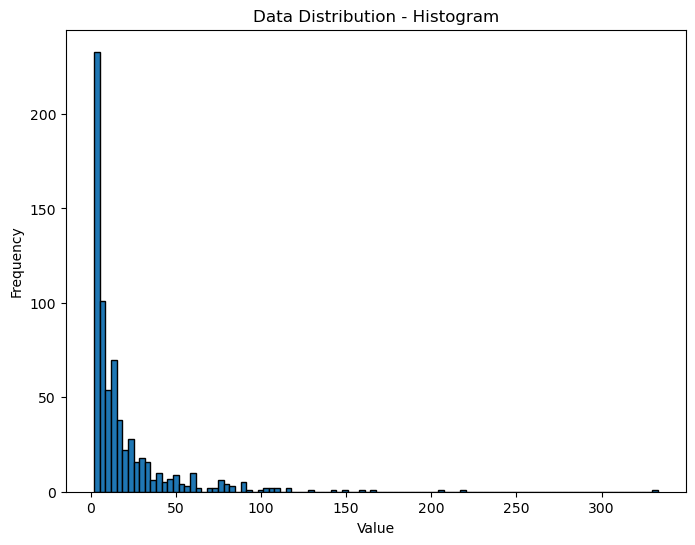

In [105]:
import matplotlib.pyplot as plt

def plot_histogram(data, bins=10):
    plt.figure(figsize=(8, 6))
    plt.hist(data, bins=bins, edgecolor='black')
    plt.title('Data Distribution - Histogram')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.show()

# 示例使用
data = [1, 2, 2, 3, 4, 4, 4, 5, 5, 6, 7, 8, 9, 10]
plot_histogram(limit_times, bins=100)


In [98]:
df_st_10yr[df_st_10yr['h_tank']==0.1].shape[0]*5/692

95.97543352601156

## runoff_coefficient versus hmax, divided by frac

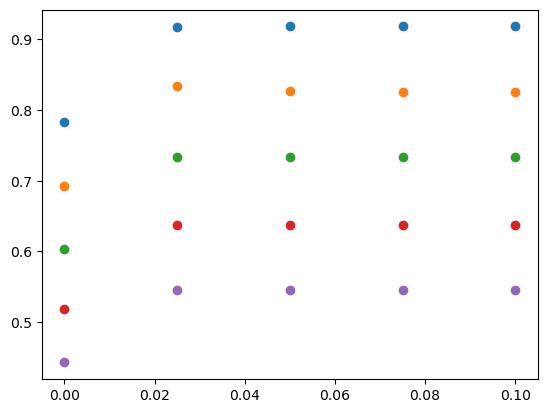

In [40]:
rt2tk_range = np.linspace(0.1,1,5)
hmax_range = np.linspace(0,0.1,5)
fig, ax = plt.subplots()

for rt2tk in rt2tk_range:
    p_fail = []
    rc = []
    for h in hmax_range:
        # vtmax= rt2tk*sum(omegat_st)*hmax
        df = model_st3(df_precp_10yr, frac_rt2tk=rt2tk,hmax=h, qp="", kp=0.001)
        # time_fail = df[df['h_tank']==h].shape[0]
        # p_fail.append(time_fail/df.shape[0])
        rain_total = np.max(df['precp'].cumsum()*0.5*area_tt/1000)
        runoff_total = np.max(df['Qout'].cumsum()*300)
        rc.append(runoff_total/rain_total)

    # p_fail = np.array(p_fail, dtype=float)  # 转换为 float 类型
    # p_fail[p_fail == 0] = np.nan  # 将 0 替换为 NaN
    ax.scatter(hmax_range, rc, label="frac="+str(rt2tk))

In [41]:
rc

[0.44293846494666156,
 0.5457877998139573,
 0.5458365453108966,
 0.5458365453108966,
 0.5458365453108966]

In [24]:
source1 = ColumnDataSource(df_st_10yr)
# Create a new plot with a title and axis labels
p = figure(title="Swisstech", x_axis_type="datetime",x_axis_label='Date', y_axis_label='Rainfall intensity (mm/10min)', width =1000)

# Add the first line (linked to the default primary y-axis)
# p.line('time', 'precp',source=source1, legend_label="Rainfall", line_color="blue", line_width=0.5)
p.vbar(x='time', top='precp', width=0.5, source=source1, color='navy', alpha=0.6)

# Add a second y-axis to the plot
p.extra_y_ranges = {"test": Range1d(start=0, end=np.max(df_st_base['discharge_de_shift']+0.05))}
p.add_layout(LinearAxis(y_range_name="test", axis_label='Water Discharge (m^3/s)'), 'right')

# Add the second line (linked to the secondary y-axis)
p.line('time', 'Qout', source=source1, legend_label="Modeled", line_color="green", line_width=2, y_range_name="test")
p.line('time', 'discharge_de_shift', source=source1, legend_label="Measured", line_color="red", line_width=2, y_range_name="test")
p.line('time', 'Stormwater', source=source1, legend_label="Stormwater", line_color="purple", line_width=2, y_range_name="test")
# p.line('time', 'Simulation', source=source1, legend_label="Simulation", line_color="black", line_width=2, y_range_name="test")
# p.line('time', 'Qs', source=source1, legend_label="Qs", line_color="pink", line_width=2, y_range_name="test")
p.legend.location="top_left"
# Show the plot
show(p)

NameError: name 'df_st_base' is not defined

# Discuss and check

## Rainfall + 3 models